In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import *
from sklearn import preprocessing
from sklearn.preprocessing import *
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from scipy.integrate import simps
import warnings
import scipy.stats
import pywt

In [2]:
# Reading patient data
CGMDatenumLunchPat1 = pd.read_csv('CGMDatenumLunchPat1.csv')
CGMSeriesLunchPat1 = pd.read_csv('CGMSeriesLunchPat1.csv')
InsulinBasalLunchPat1 = pd.read_csv('InsulinBasalLunchPat1.csv')
InsulinBolusLunchPat1 = pd.read_csv('InsulinBolusLunchPat1.csv')
InsulinDatenumLunchPat1 = pd.read_csv('InsulinDatenumLunchPat1.csv')

CGMDatenumLunchPat2 = pd.read_csv('CGMDatenumLunchPat2.csv')
CGMSeriesLunchPat2 = pd.read_csv('CGMSeriesLunchPat2.csv')
InsulinBasalLunchPat2 = pd.read_csv('InsulinBasalLunchPat2.csv')
InsulinBolusLunchPat2 = pd.read_csv('InsulinBolusLunchPat2.csv')
InsulinDatenumLunchPat2 = pd.read_csv('InsulinDatenumLunchPat2.csv')

CGMDatenumLunchPat3 = pd.read_csv('CGMDatenumLunchPat3.csv')
CGMSeriesLunchPat3 = pd.read_csv('CGMSeriesLunchPat3.csv')
InsulinBasalLunchPat3 = pd.read_csv('InsulinBasalLunchPat3.csv')
InsulinBolusLunchPat3 = pd.read_csv('InsulinBolusLunchPat3.csv')
InsulinDatenumLunchPat3 = pd.read_csv('InsulinDatenumLunchPat3.csv')

CGMDatenumLunchPat4 = pd.read_csv('CGMDatenumLunchPat4.csv')
CGMSeriesLunchPat4 = pd.read_csv('CGMSeriesLunchPat4.csv')
InsulinBasalLunchPat4= pd.read_csv('InsulinBasalLunchPat4.csv')
InsulinBolusLunchPat4= pd.read_csv('InsulinBolusLunchPat4.csv')
InsulinDatenumLunchPat4 = pd.read_csv('InsulinDatenumLunchPat4.csv')

CGMDatenumLunchPat5 = pd.read_csv('CGMDatenumLunchPat5.csv')
CGMSeriesLunchPat5 = pd.read_csv('CGMSeriesLunchPat5.csv')
InsulinBasalLunchPat5 = pd.read_csv('InsulinBasalLunchPat5.csv')
InsulinBolusLunchPat5 = pd.read_csv('InsulinBolusLunchPat5.csv')
InsulinDatenumLunchPat5 = pd.read_csv('InsulinDatenumLunchPat5.csv')

In [3]:
# Pre-processing data
CGMDatenumLunchPat4 = CGMDatenumLunchPat4.iloc[:,0:30].dropna()

CGMSeriesLunchPat2 = CGMSeriesLunchPat2.iloc[:,0:30].dropna()
CGMSeriesLunchPat3 = CGMSeriesLunchPat3.iloc[:,0:30].dropna()
CGMSeriesLunchPat4 = CGMSeriesLunchPat4.iloc[:,0:30].dropna()
CGMSeriesLunchPat5 = CGMSeriesLunchPat5.iloc[:,0:30].dropna()

CGMDatenumLunchPat1['cgmDatenum_31'] = CGMDatenumLunchPat1['cgmDatenum_30'] - 0.035
CGMSeriesLunchPat1['cgmSeries_31'] = CGMSeriesLunchPat1['cgmSeries_31'].replace(np.NaN, CGMSeriesLunchPat1['cgmSeries_30'] + (CGMSeriesLunchPat1['cgmSeries_30'] - CGMSeriesLunchPat1['cgmSeries_29']))

CGMDatenumLunchPat2['cgmDatenum_31'] = CGMDatenumLunchPat2['cgmDatenum_30'] - 0.035
CGMSeriesLunchPat2['cgmSeries_31'] = CGMSeriesLunchPat1['cgmSeries_31'].replace(np.NaN, CGMSeriesLunchPat2['cgmSeries_30'] + (CGMSeriesLunchPat2['cgmSeries_30'] - CGMSeriesLunchPat2['cgmSeries_29']))

CGMDatenumLunchPat3['cgmDatenum_31'] = CGMDatenumLunchPat3['cgmDatenum_30'] - 0.035
CGMSeriesLunchPat3['cgmSeries_31'] = CGMSeriesLunchPat1['cgmSeries_31'].replace(np.NaN, CGMSeriesLunchPat3['cgmSeries_30'] + (CGMSeriesLunchPat3['cgmSeries_30'] - CGMSeriesLunchPat3['cgmSeries_29']))

CGMDatenumLunchPat4['cgmDatenum_31'] = CGMDatenumLunchPat4['cgmDatenum_30'] - 0.035
CGMSeriesLunchPat4['cgmSeries_31'] = CGMSeriesLunchPat1['cgmSeries_31'].replace(np.NaN, CGMSeriesLunchPat4['cgmSeries_30'] + (CGMSeriesLunchPat4['cgmSeries_30'] - CGMSeriesLunchPat4['cgmSeries_29']))

CGMDatenumLunchPat5['cgmDatenum_31'] = CGMDatenumLunchPat5['cgmDatenum_30'] - 0.035
CGMSeriesLunchPat5['cgmSeries_31'] = CGMSeriesLunchPat1['cgmSeries_31'].replace(np.NaN, CGMSeriesLunchPat5['cgmSeries_30'] + (CGMSeriesLunchPat5['cgmSeries_30'] - CGMSeriesLunchPat5['cgmSeries_29']))

CGMSeriesLunchPat1 = CGMSeriesLunchPat1.fillna(value=0)

In [4]:
# Scaling data
scaler = MinMaxScaler(feature_range=(0,1))

CGMSeriesLunchPat1Scaled = scaler.fit_transform(CGMSeriesLunchPat1)
CGMSeriesLunchPat2Scaled = scaler.fit_transform(CGMSeriesLunchPat2)
CGMSeriesLunchPat3Scaled = scaler.fit_transform(CGMSeriesLunchPat3)
CGMSeriesLunchPat4Scaled = scaler.fit_transform(CGMSeriesLunchPat4)
CGMSeriesLunchPat5Scaled = scaler.fit_transform(CGMSeriesLunchPat5)

InsulinBolusLunchPat1Scaled = scaler.fit_transform(InsulinBolusLunchPat1)
InsulinBolusLunchPat2Scaled = scaler.fit_transform(InsulinBolusLunchPat2)
InsulinBolusLunchPat3Scaled = scaler.fit_transform(InsulinBolusLunchPat3)
InsulinBolusLunchPat4Scaled = scaler.fit_transform(InsulinBolusLunchPat4)
InsulinBolusLunchPat5Scaled = scaler.fit_transform(InsulinBolusLunchPat5)

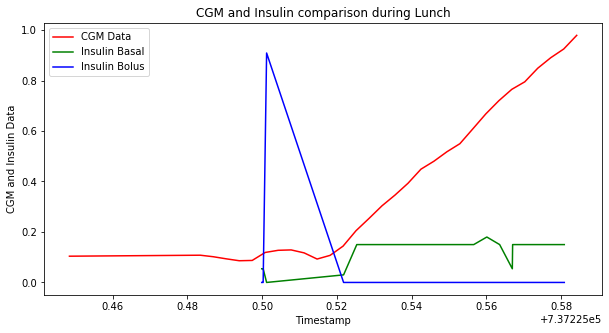

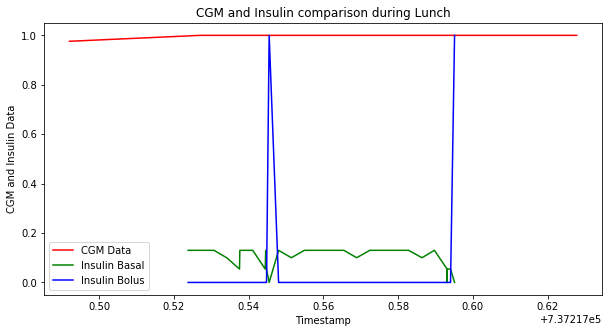

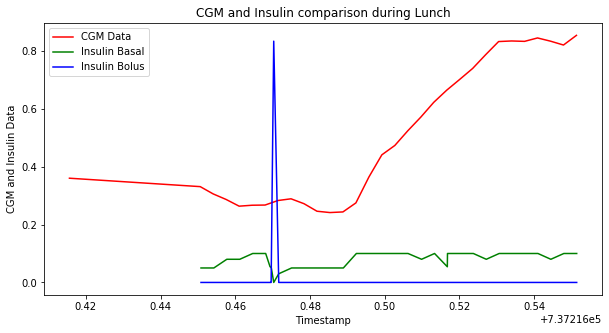

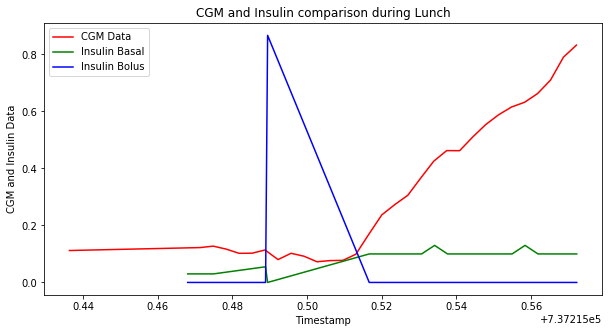

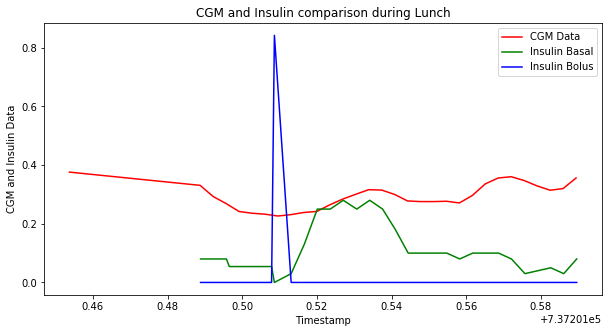

...

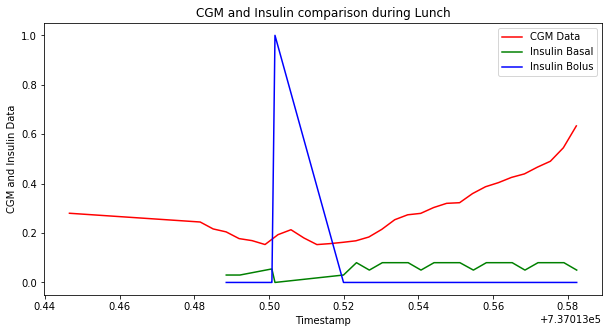

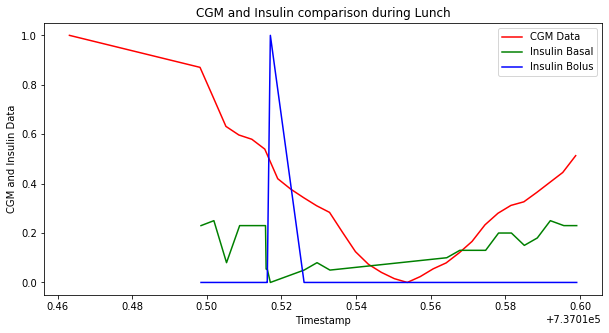

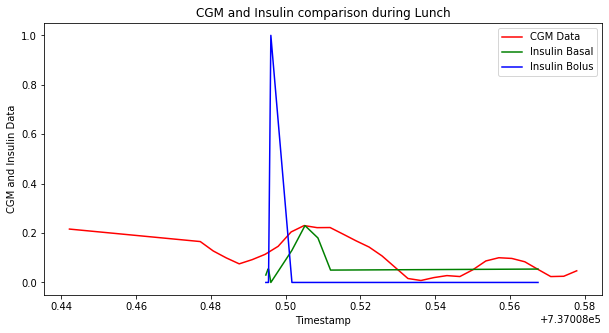

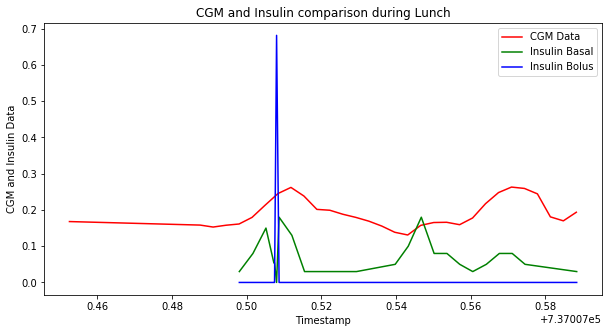

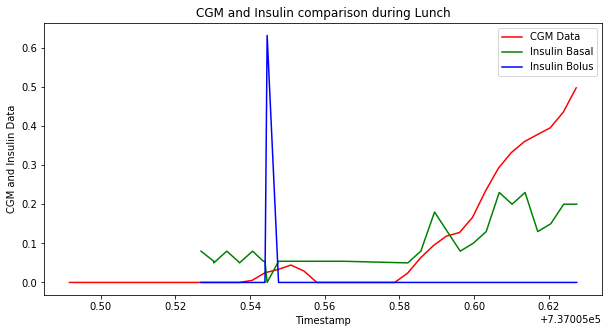

In [5]:
# Plot for CGM Data with Insulin over time for Patient 1
for i in range(len(CGMSeriesLunchPat1Scaled)):
    plt.figure(figsize=(10,5))
    plt.xlabel("Timestamp")
    plt.ylabel("CGM and Insulin Data")
    plt.title("CGM and Insulin comparison during Lunch")
    plt.plot(CGMDatenumLunchPat1.iloc[i], CGMSeriesLunchPat1Scaled[i], c='r', label = 'CGM Data')
    plt.plot(InsulinDatenumLunchPat1.iloc[i], InsulinBasalLunchPat1.iloc[i], c='g', label = 'Insulin Basal')
    plt.plot(InsulinDatenumLunchPat1.iloc[i], InsulinBolusLunchPat1Scaled[i], c='b', label = 'Insulin Bolus')
    plt.legend()
    plt.show()

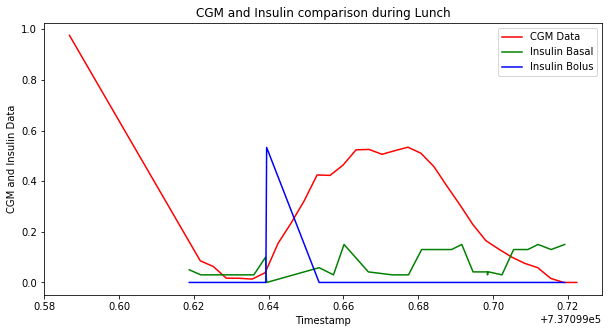

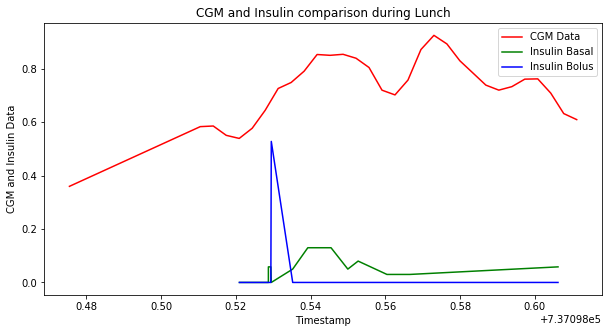

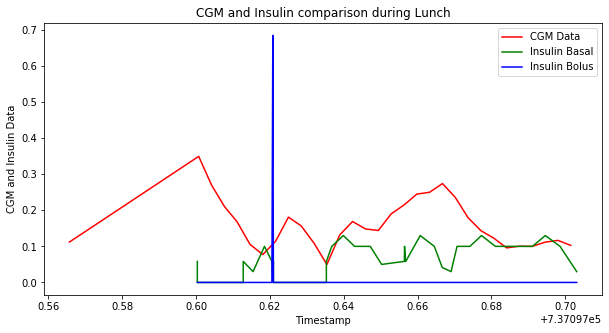

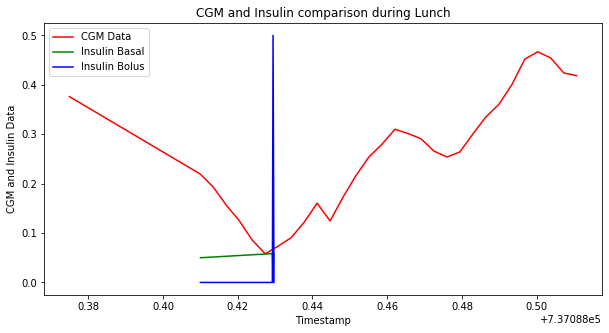

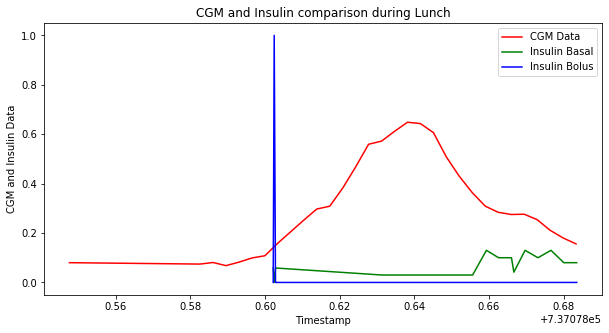

...

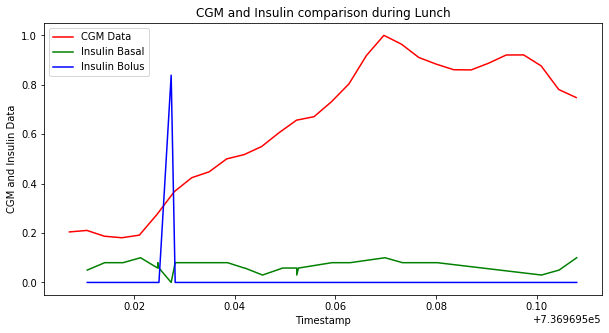

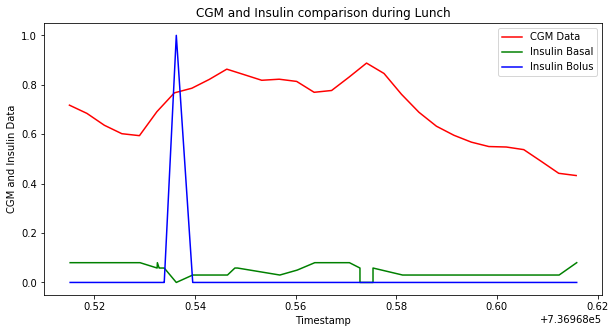

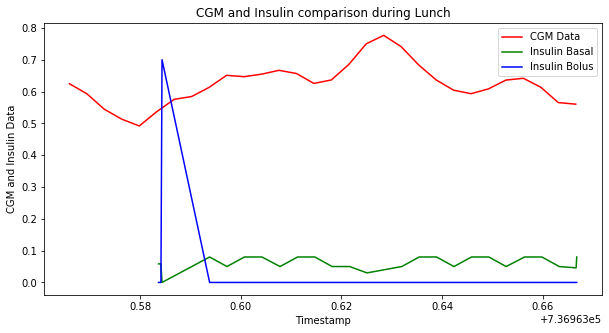

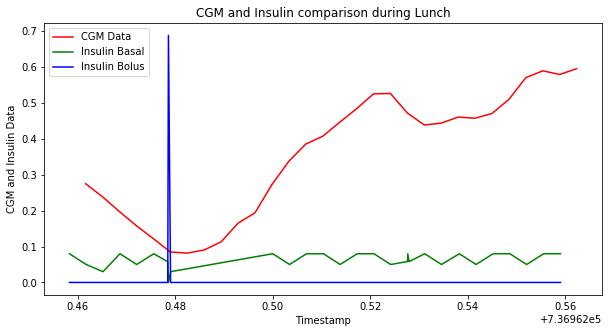

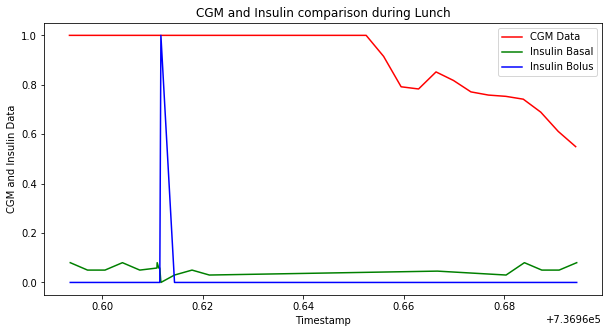

In [6]:
# Plot for CGM Data with Insulin over time for Patient 2
for i in range(len(CGMSeriesLunchPat2Scaled)):
    plt.figure(figsize=(10,5))
    plt.xlabel("Timestamp")
    plt.ylabel("CGM and Insulin Data")
    plt.title("CGM and Insulin comparison during Lunch")
    plt.plot(CGMDatenumLunchPat2.iloc[i], CGMSeriesLunchPat2Scaled[i], c='r', label = 'CGM Data')
    plt.plot(InsulinDatenumLunchPat2.iloc[i], InsulinBasalLunchPat2.iloc[i], c='g', label = 'Insulin Basal')
    plt.plot(InsulinDatenumLunchPat2.iloc[i], InsulinBolusLunchPat2Scaled[i], c='b', label = 'Insulin Bolus')
    plt.legend()
    plt.show()

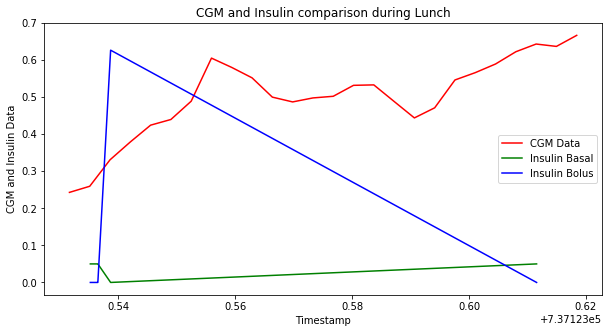

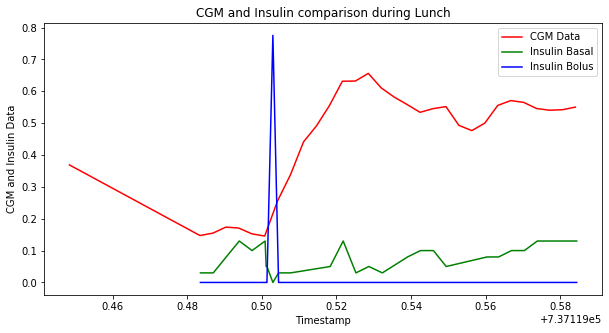

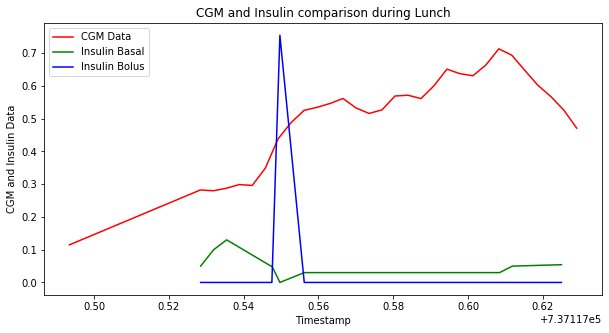

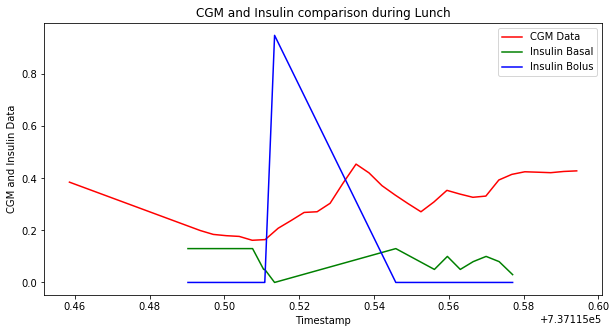

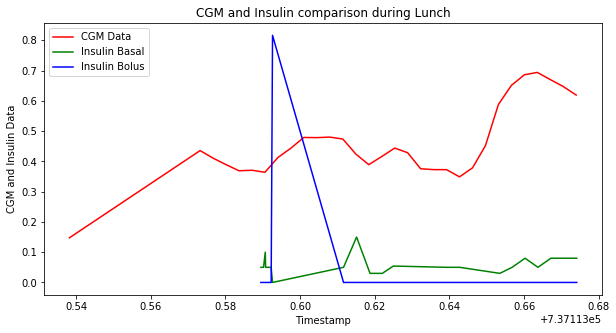

...

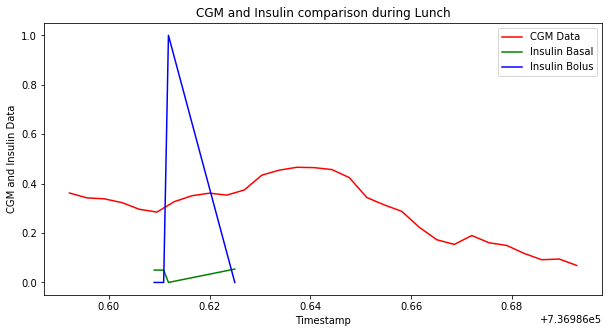

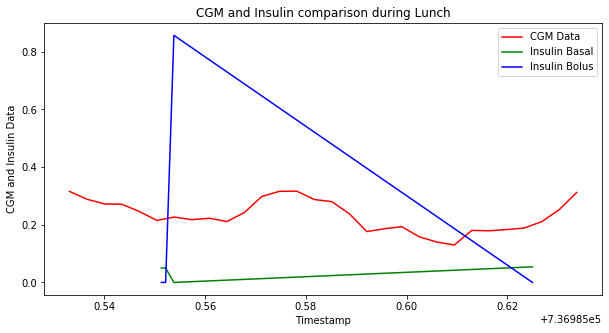

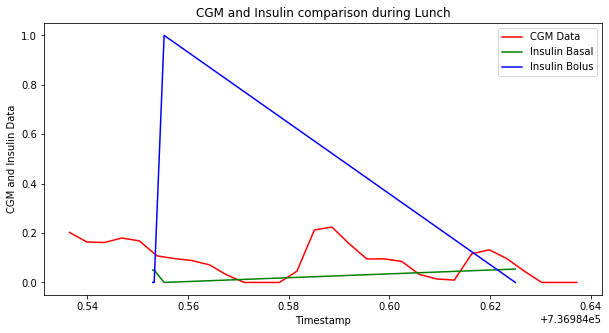

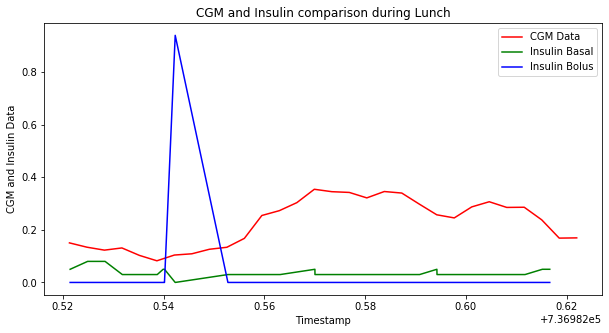

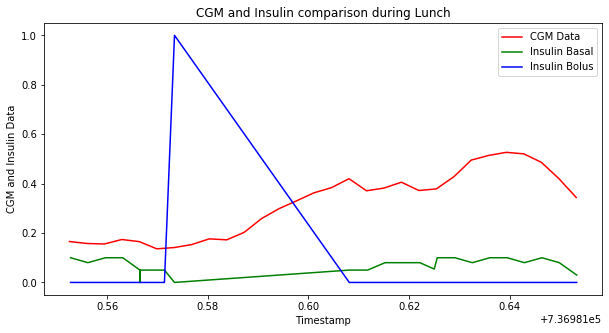

In [7]:
# Plot for CGM Data with Insulin over time for Patient 3
for i in range(len(CGMSeriesLunchPat3Scaled)):
    plt.figure(figsize=(10,5))
    plt.xlabel("Timestamp")
    plt.ylabel("CGM and Insulin Data")
    plt.title("CGM and Insulin comparison during Lunch")
    plt.plot(CGMDatenumLunchPat3.iloc[i], CGMSeriesLunchPat3Scaled[i], c='r', label = 'CGM Data')
    plt.plot(InsulinDatenumLunchPat3.iloc[i], InsulinBasalLunchPat3.iloc[i], c='g', label = 'Insulin Basal')
    plt.plot(InsulinDatenumLunchPat3.iloc[i], InsulinBolusLunchPat3Scaled[i], c='b', label = 'Insulin Bolus')
    plt.legend()
    plt.show()

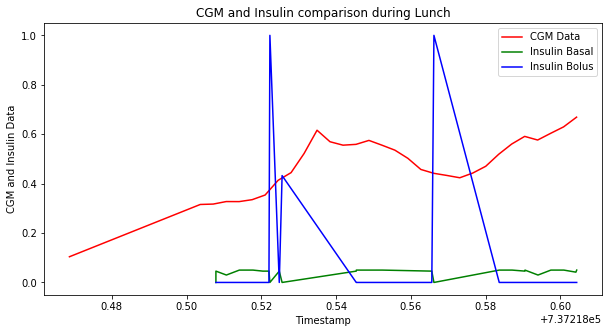

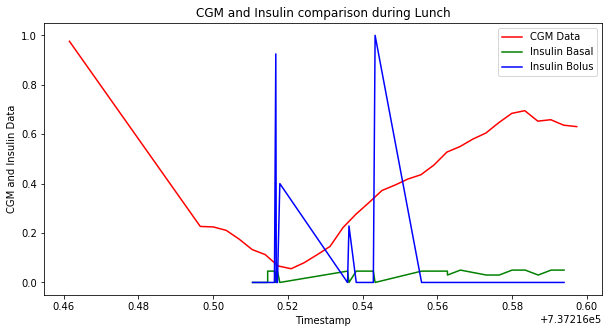

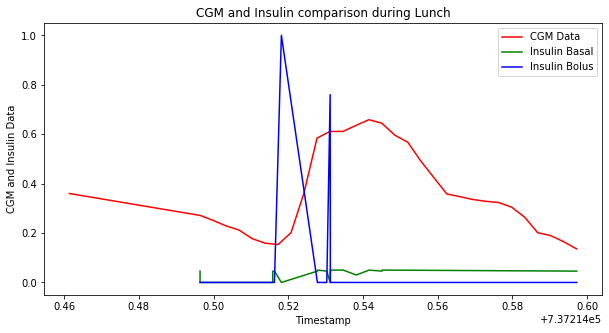

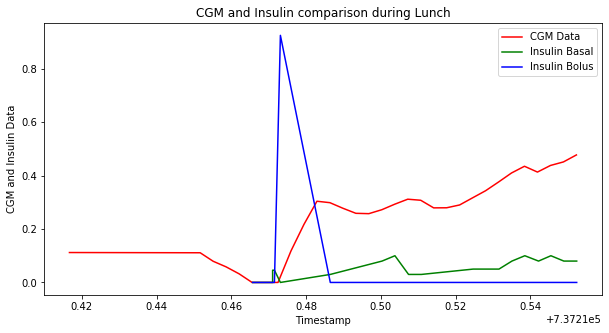

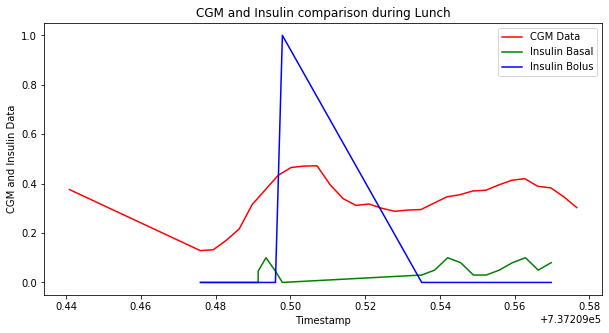

...

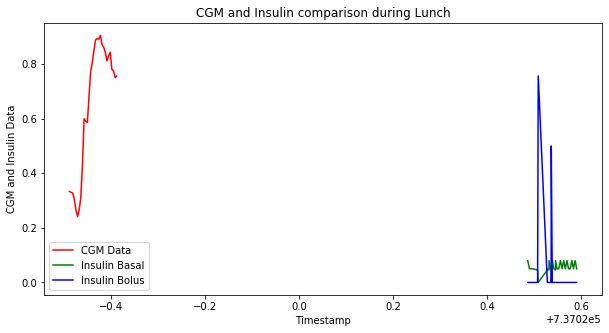

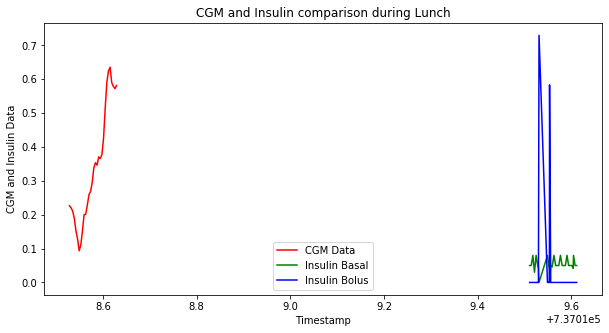

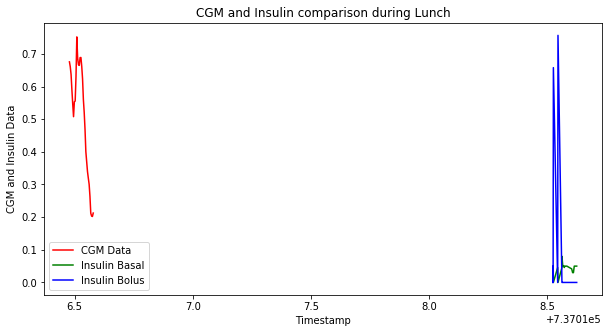

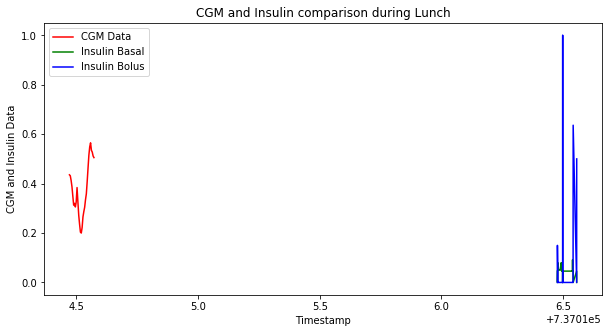

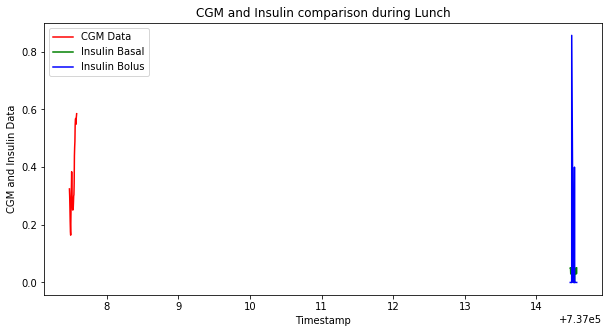

In [8]:
# Plot for CGM Data with Insulin over time for Patient 4
for i in range(len(CGMSeriesLunchPat4Scaled)):
    plt.figure(figsize=(10,5))
    plt.xlabel("Timestamp")
    plt.ylabel("CGM and Insulin Data")
    plt.title("CGM and Insulin comparison during Lunch")
    plt.plot(CGMDatenumLunchPat4.iloc[i], CGMSeriesLunchPat4Scaled[i], c='r', label = 'CGM Data')
    plt.plot(InsulinDatenumLunchPat4.iloc[i], InsulinBasalLunchPat4.iloc[i], c='g', label = 'Insulin Basal')
    plt.plot(InsulinDatenumLunchPat4.iloc[i], InsulinBolusLunchPat4Scaled[i], c='b', label = 'Insulin Bolus')
    plt.legend()
    plt.show()

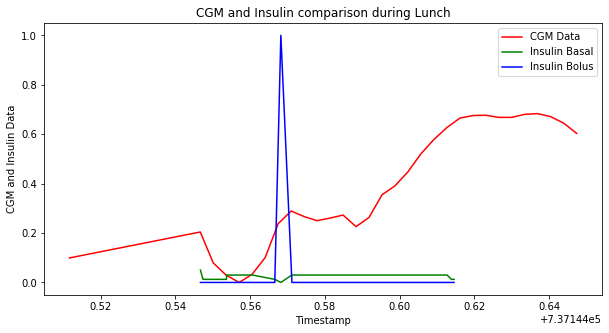

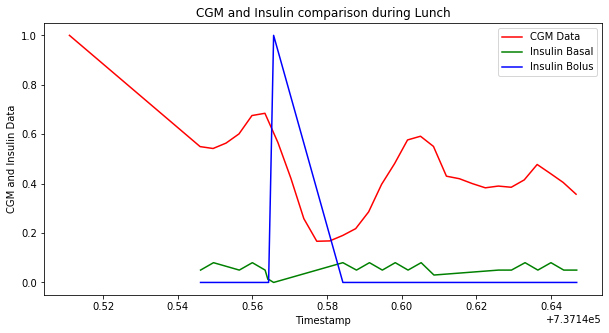

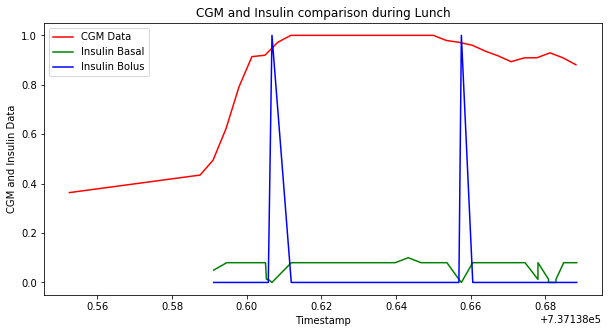

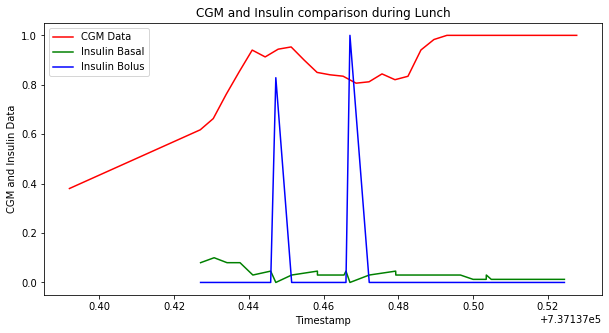

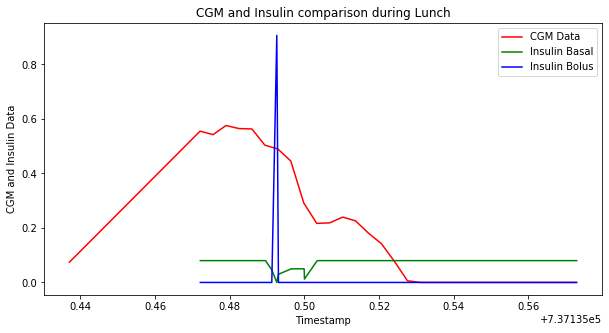

...

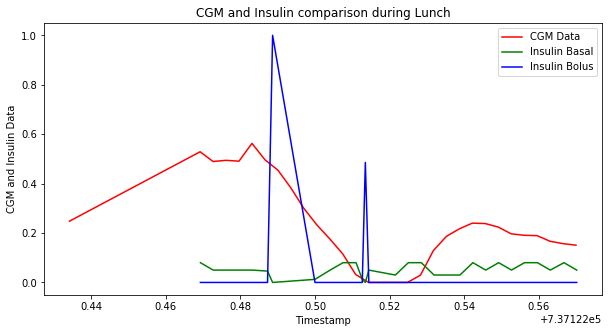

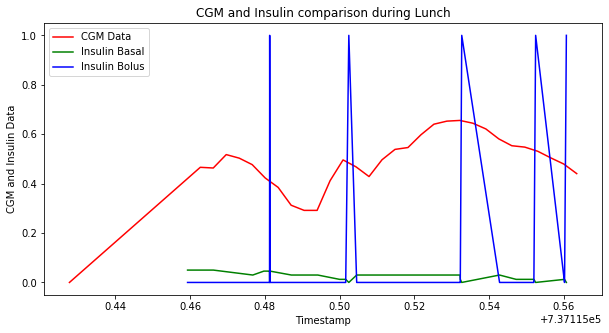

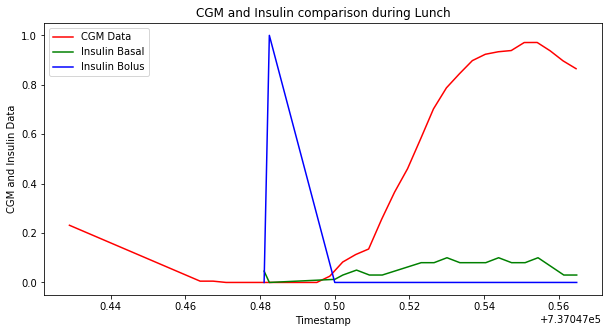

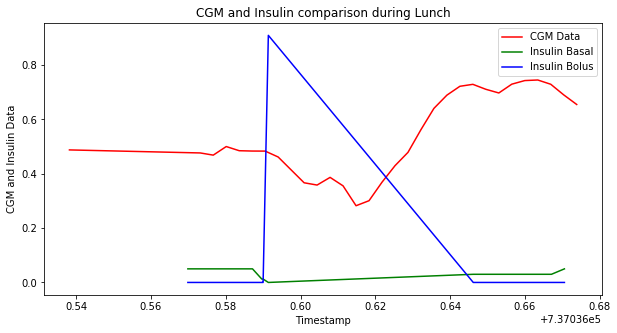

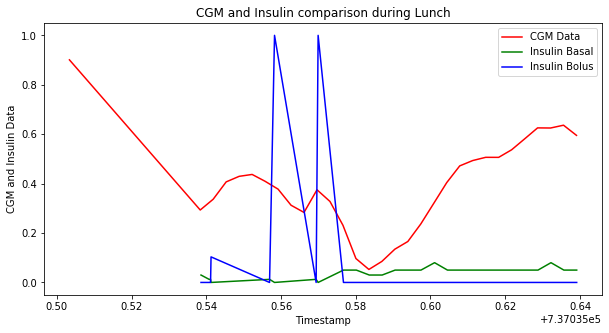

In [9]:
# Plot for CGM Data with Insulin over time for Patient 5
for i in range(len(CGMSeriesLunchPat5Scaled)):
    plt.figure(figsize=(10,5))
    plt.xlabel("Timestamp")
    plt.ylabel("CGM and Insulin Data")
    plt.title("CGM and Insulin comparison during Lunch")
    plt.plot(CGMDatenumLunchPat5.iloc[i], CGMSeriesLunchPat5Scaled[i], c='r', label = 'CGM Data')
    plt.plot(InsulinDatenumLunchPat5.iloc[i], InsulinBasalLunchPat5.iloc[i], c='g', label = 'Insulin Basal')
    plt.plot(InsulinDatenumLunchPat5.iloc[i], InsulinBolusLunchPat5Scaled[i], c='b', label = 'Insulin Bolus')
    plt.legend()
    plt.show()

In [10]:
# Fast Fourier Transform
top_fft_features = []
auc_features = [0,0,0,0,0]
df_list = [CGMSeriesLunchPat1Scaled, CGMSeriesLunchPat2Scaled, CGMSeriesLunchPat3Scaled, CGMSeriesLunchPat4Scaled, CGMSeriesLunchPat5Scaled]
df_dateNum_list = [CGMDatenumLunchPat1, CGMDatenumLunchPat2, CGMDatenumLunchPat3, CGMDatenumLunchPat4, CGMDatenumLunchPat5]
i = 0
for df,df_datenum in zip(df_list,df_dateNum_list):
    if len(top_fft_features) == 0:
        top_fft_features = np.abs(np.fft.fft(np.flip(df)))
    else:
        top_fft_features = np.concatenate((top_fft_features, np.abs(np.fft.fft(np.flip(df)))))

top_fft_features[:,1:9].shape

(186, 8)

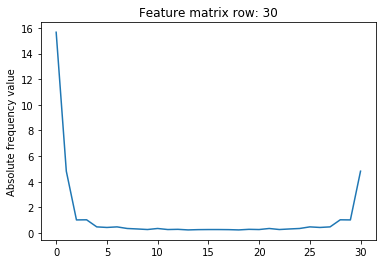

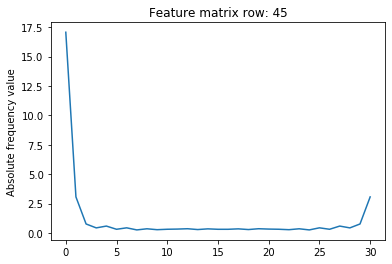

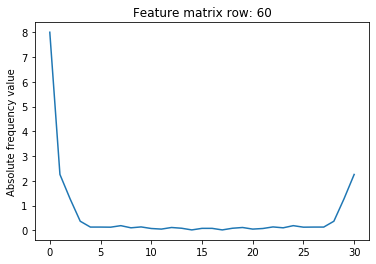

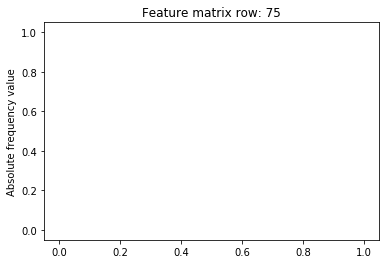

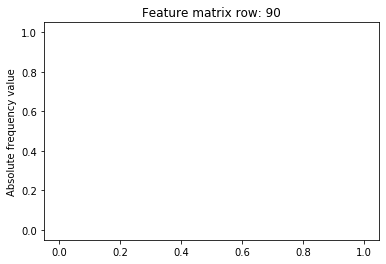

...

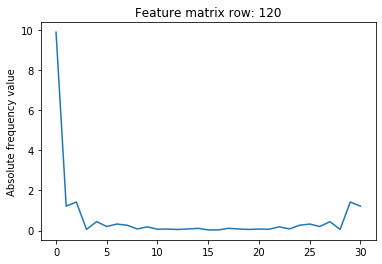

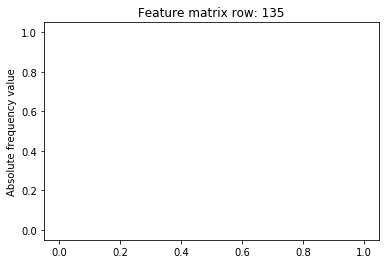

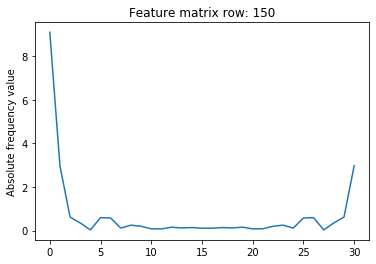

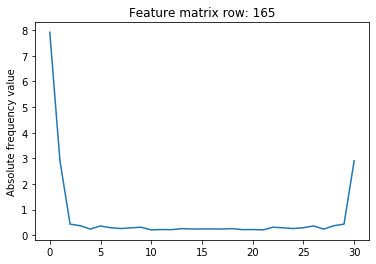

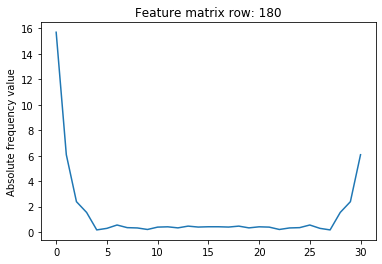

In [11]:
for i in [30,45,60,75,90,105,120,135,150,165,180]:
    plt.title("Feature matrix row: "+str(i))
    plt.ylabel("Absolute frequency value")
    plt.plot(top_fft_features[i])
    plt.show()

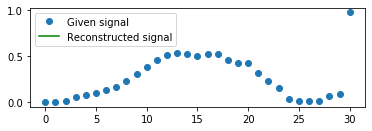

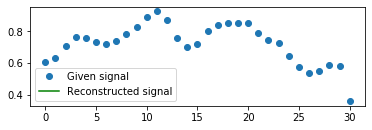

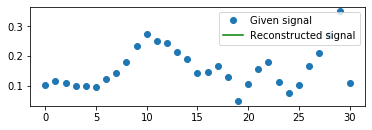

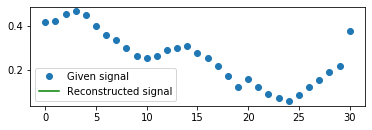

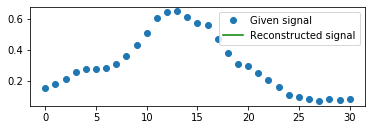

...

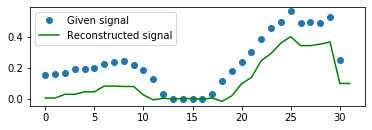

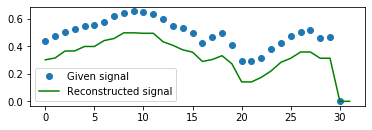

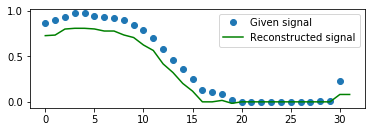

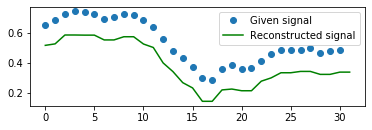

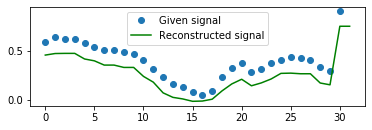

(186, 6)

In [12]:
# Discrete Wavelet Transform
def calc_feature_dwt(df):
    cA, cB = pywt.dwt(df, 'haar')
    cA_threshold = pywt.threshold(cA, np.std(cA)/2, mode='soft')
    cB_threshold = pywt.threshold(cB, np.std(cB)/2, mode='soft')

    reconstructed_signal = pywt.idwt(cA_threshold, cB_threshold, 'haar')

    for i in range(len(df)):
        plt.subplot(212)
        plt.plot(df[i], 'o')
        plt.plot(reconstructed_signal[i], 'g')
        plt.legend(['Given signal', 'Reconstructed signal'])
        plt.show()

    feature_dwt_top8 = cA[:,:-8]

    return feature_dwt_top8

calc_feature_dwt(CGMSeriesLunchPat2Scaled)

df_list = [CGMSeriesLunchPat1Scaled, CGMSeriesLunchPat2Scaled, CGMSeriesLunchPat3Scaled, CGMSeriesLunchPat4Scaled, CGMSeriesLunchPat5Scaled]
top_dwt_features = []
for df in df_list:
    if len(top_dwt_features) == 0:
        top_dwt_features = calc_feature_dwt(df)
    else:
        top_dwt_features = np.concatenate((top_dwt_features, calc_feature_dwt(df)))
        
top_dwt_features[:,1:7].shape

In [13]:
# Coeffecient of Variation
feature_cov = []
for i in range(len(CGMSeriesLunchPat1Scaled)):
    feature_cov.append(np.mean(CGMSeriesLunchPat1Scaled[i]) / np.std(CGMSeriesLunchPat1Scaled[i]))
    
for i in range(len(CGMSeriesLunchPat2Scaled)):
    feature_cov.append(np.mean(CGMSeriesLunchPat2Scaled[i]) / np.std(CGMSeriesLunchPat2Scaled[i]))

for i in range(len(CGMSeriesLunchPat3Scaled)):
    feature_cov.append(np.mean(CGMSeriesLunchPat3Scaled[i]) / np.std(CGMSeriesLunchPat3Scaled[i]))
    
for i in range(len(CGMSeriesLunchPat4Scaled)):
    feature_cov.append(np.mean(CGMSeriesLunchPat4Scaled[i]) / np.std(CGMSeriesLunchPat4Scaled[i]))
    
for i in range(len(CGMSeriesLunchPat5Scaled)):
    feature_cov.append(np.mean(CGMSeriesLunchPat5Scaled[i]) / np.std(CGMSeriesLunchPat5Scaled[i]))

feature_cov_ = np.asarray(feature_cov)

feature_cov_wo_nan = feature_cov_[np.isnan(feature_cov_) == False]
feature_cov_wo_nan.sort()
mean_with_threshold = np.mean(feature_cov_wo_nan[0:len(feature_cov_wo_nan)-1])
mean_with_threshold

feature_cov_[feature_cov_ > 200] = mean_with_threshold
for x in range(len(feature_cov_)):
    if np.isnan(feature_cov_[x]):
        feature_cov_[x] = mean_with_threshold

C:\Users\debar\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater


[ 92.  91.  90.  91.  91.  97.  99.  98.  99.  99. 102. 113. 131. 146.
 163. 179. 194. 207. 213. 221. 228. 236. 241. 246. 252. 254. 258. 260.
 258. 256.]
[1.6094137602754877, 1.6094047869912564, 1.5953516489027932, 1.6067385385483246, 1.6088506417842015, 1.6094064464048212]


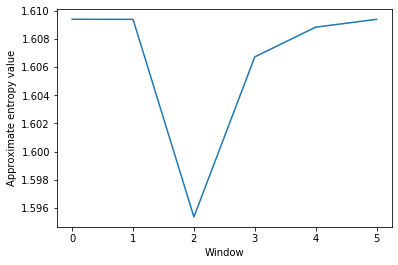

[216. 232. 245. 261. 269. 275. 284. 294. 310. 324. 335. 345. 348. 349.
 351. 349. 347. 347. 345. 343. 341. 335. 325. 316. 310. 303. 292. 283.
 273. 260.]
[1.6063404224460118, 1.6076823900183754, 1.6093038149404482, 1.6094205485987954, 1.6088134582428515, 1.608044280333151]


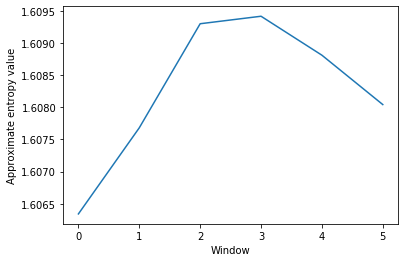

[123. 123. 123. 124. 126. 127. 132. 134. 136. 137. 137. 140. 150. 176.
 200. 212. 227. 238. 249. 258. 266. 269. 271. 274. 269. 263. 257. 248.
 237. 232.]
[1.6093937031477092, 1.6090815650544728, 1.5985274704168535, 1.6070848047496558, 1.6093901371785109, 1.6083241484593036]


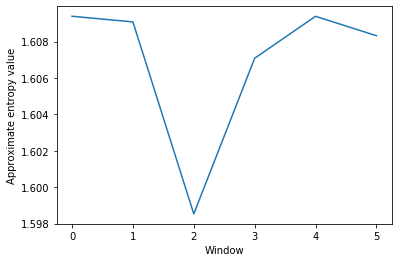

[ 94.  95.  94.  94.  94.  96.  89.  92.  93.  94.  94.  95. 102. 123.
 145. 160. 172. 186. 199. 207. 206. 211. 212. 213. 215. 215. 216. 222.
 231. 228.]
[1.609428916021571, 1.6091257703895794, 1.5945567905929918, 1.6050906516350965, 1.609336386524802, 1.6090314951207616]


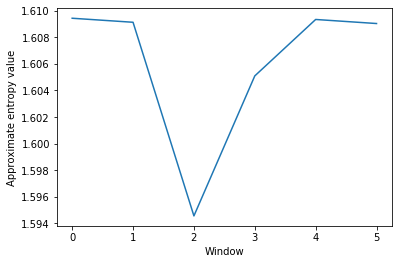

[123. 121. 120. 120. 120. 120. 120. 121. 128. 136. 143. 151. 157. 163.
 166. 167. 165. 163. 161. 160. 158. 157. 157. 155. 152. 147. 141. 139.
 137. 137.]
[1.60939148414417, 1.6082002696936644, 1.6080145805495438, 1.609314887073657, 1.6093436127658103, 1.609090789770869]


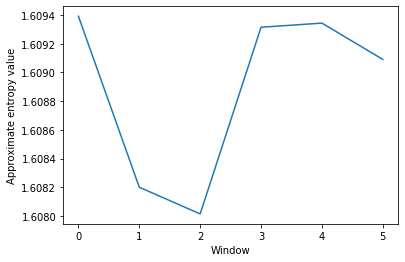

[ 87.  87.  87.  90.  94.  98.  98.  96.  95.  97. 106. 128. 144. 159.
 173. 186. 199. 210. 212. 218. 222. 226. 222. 217. 212. 211. 214. 215.
 215. 213.]
[1.608962824116913, 1.6093652335405493, 1.5955287067992108, 1.6078963434749614, 1.6091953690209324, 1.6094133221707687]


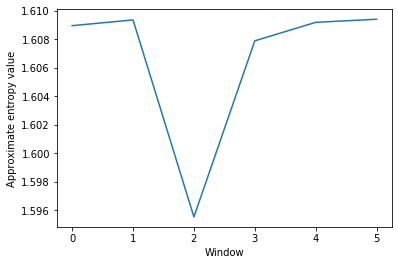

[ 98. 100. 100. 104. 109. 110. 112. 111. 111. 107.  98.  98. 106. 132.
 153. 156. 159. 166. 174. 181. 187. 186. 186. 183. 178. 172. 172. 170.
 167. 164.]
[1.6087092716498614, 1.6093153830168372, 1.592801607647935, 1.6079027005565039, 1.6092774614614664, 1.6092692958078971]


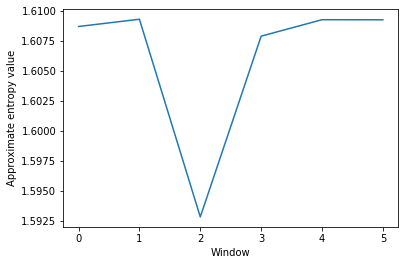

[ 93.  94.  95.  94.  94.  94.  92.  91.  92.  94.  95.  98. 107. 122.
 139. 154. 166. 176. 187. 200. 207. 213. 219. 225. 227. 226. 229. 230.
 230. 228.]
[1.6094152773308166, 1.6093539820844684, 1.599025277961529, 1.6053335342086998, 1.608854591886118, 1.6094164458107865]


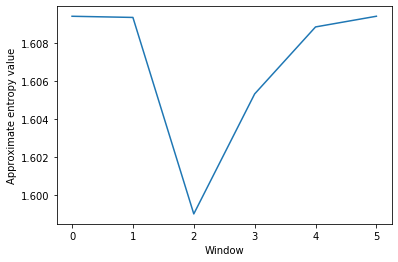

[100. 100. 100. 101. 102. 108. 111. 114. 116. 116. 115. 118. 127. 141.
 151. 159. 165. 171. 175. 175. 176. 176. 176. 178. 181. 183. 184. 185.
 186. 187.]
[1.609406363037333, 1.6090601164053189, 1.6039645920933117, 1.608761088443804, 1.609377131135679, 1.6094086935427099]


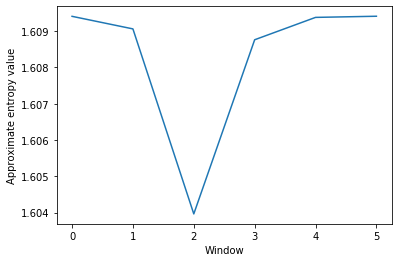

[127. 127. 129. 129. 129. 128. 128. 149. 151. 152. 155. 162. 174. 184.
 187. 192. 193. 190. 187. 182. 173. 158. 151. 146. 142. 140. 137. 135.
 133. 134.]
[1.6094086761898598, 1.6063044868053258, 1.6068624490333934, 1.6092157636049775, 1.6069713909850982, 1.6092715129197284]


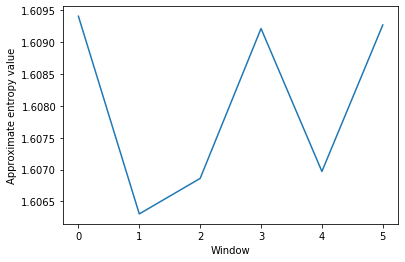

[132. 130. 122. 115. 104.  96.  99. 102. 106. 111. 121. 141. 159. 182.
 201. 208. 216. 220. 225. 228. 227. 228. 230. 229. 226. 223. 221. 220.
 219. 219.]
[1.605758410540518, 1.6081300459594832, 1.593685000172256, 1.6089219618861872, 1.6094186755361874, 1.6094148935892876]


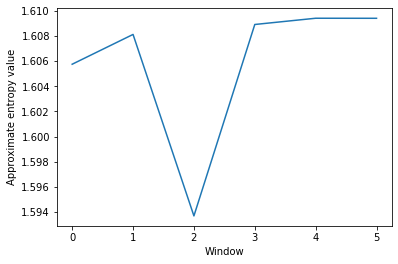

[ 79.  80.  81.  82.  83.  84.  77.  75.  77.  80.  83.  87.  93. 103.
 116. 137. 153. 171. 188. 203. 214. 226. 232. 239. 242. 242. 239. 235.
 231. 227.]
[1.6092854834767636, 1.6086483259724687, 1.6019626252760983, 1.599756996628654, 1.608491500391916, 1.6091750160914153]


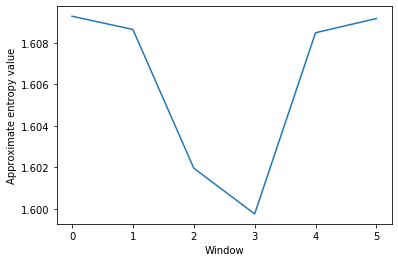

[110. 111. 110. 111. 115. 117. 114. 112. 112. 113. 117. 129. 142. 150.
 159. 167. 176. 185. 193. 198. 201. 200. 197. 196. 195. 195. 194. 194.
 191. 187.]
[1.6093002849408504, 1.6093053198251908, 1.6036453031840139, 1.6075602725450628, 1.6093694766985691, 1.6093215309835953]


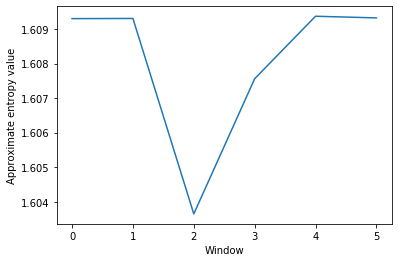

[108. 107. 105. 102.  99.  97. 102. 106. 111. 114. 113. 116. 125. 143.
 169. 178. 183. 189. 196. 200. 204. 206. 204. 203. 198. 195. 188. 173.
 162. 157.]
[1.60893087341997, 1.6077766078511782, 1.5977008300076765, 1.6085242072262627, 1.6093501633161884, 1.6059648617548632]


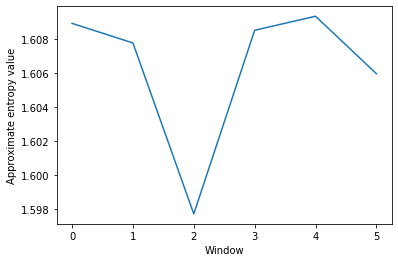

[ 79.  79.  80.  81.  82.  81.  94. 101. 104. 106. 106. 104. 103. 103.
 103. 102.  99.  97.  97.  97. 101. 109. 113. 117. 120. 119. 118. 120.
 122. 121.]
[1.6093323717758055, 1.6049566470498826, 1.6093750684268917, 1.6092409383158763, 1.6076648651870138, 1.6093684652565985]


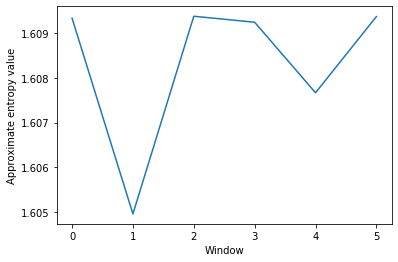

[106. 102. 101. 100. 101.  99.  98. 101. 103. 104. 104. 106. 111. 121.
 134. 144. 154. 163. 170. 177. 185. 194. 202. 206. 212. 216. 216. 213.
 211. 207.]
[1.6092281101661787, 1.609183004379592, 1.6048919679131157, 1.6068277322757272, 1.608317174670636, 1.60931099942845]


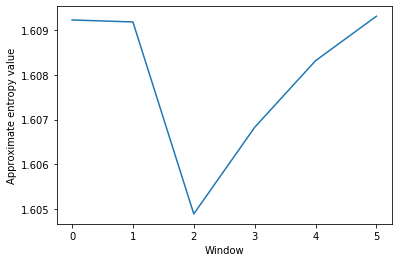

[138. 138. 137. 135. 134. 131. 130. 130. 129. 129. 132. 139. 153. 167.
 177. 187. 196. 205. 211. 216. 220. 219. 218. 217. 216. 216. 217. 218.
 218. 216.]
[1.6093668539952926, 1.609421304095286, 1.603474366222183, 1.608114795409294, 1.60941687018336, 1.6094294178511668]


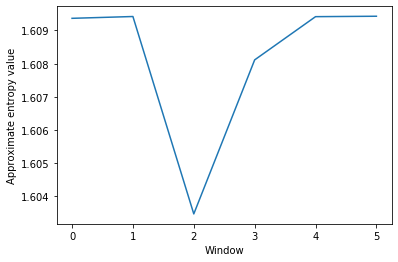

[196. 204. 212. 220. 227. 231. 231. 228. 223. 216. 205. 194. 185. 173.
 159. 148. 138. 128. 117. 104.  90.  82.  72.  66.  63.  64.  67.  73.
  76.  80.]
[1.6080784982457257, 1.6091165927076185, 1.605581244344128, 1.601972553644606, 1.6004295995071955, 1.6061475684676056]


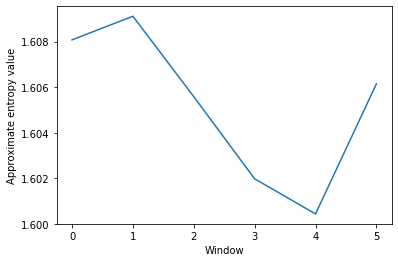

[ 87.  85.  83.  79.  74.  73.  75.  77.  79.  77.  78.  82.  98. 116.
 131. 143. 152. 160. 161. 162. 159. 156. 155. 156. 159. 169. 177. 181.
 182. 180.]
[1.6078104812332144, 1.6090787372542132, 1.5897695358597912, 1.6083445951252324, 1.6093811653105963, 1.6090839640235826]


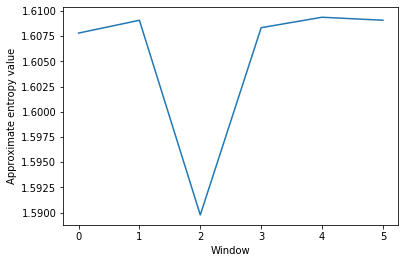

[ 97.  99. 100. 101. 104. 106. 116. 119. 119. 119. 124. 136. 155. 167.
 177. 185. 190. 193. 196. 200. 204. 206. 201. 194. 183. 169. 160. 152.
 144. 136.]
[1.6091716212672367, 1.608473301087618, 1.6011054123669384, 1.609085532860116, 1.6085331988986638, 1.6065325536210908]


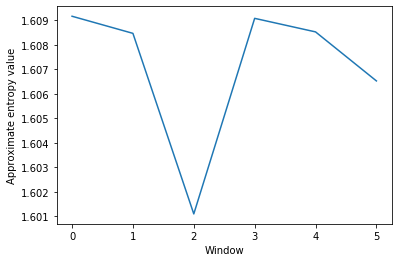

[117. 116. 114. 115. 115. 124. 128. 131. 131. 130. 133. 145. 166. 177.
 183. 187. 186. 181. 181. 186. 197. 205. 199. 192. 183. 168. 156. 144.
 135. 127.]
[1.6093988953119196, 1.609226730522579, 1.6023514231500977, 1.6093351727467862, 1.6087177935808739, 1.6044411699245622]


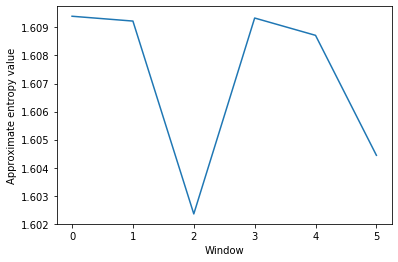

[102. 101.  98.  92.  86.  82.  80.  82.  85.  84.  83.  84.  90.  98.
 101. 101.  97.  93.  91.  90.  90.  90.  90.  92.  93.  94.  94.  92.
  92.  93.]
[1.6074425000581127, 1.6092150137122114, 1.6062883424302565, 1.6085108173613916, 1.6093415663335084, 1.6093916634216856]


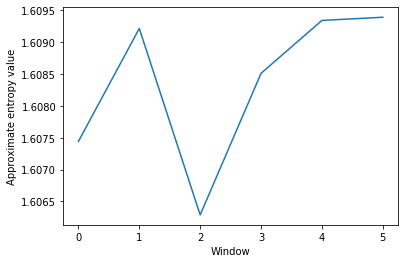

[148. 147. 145. 141. 135. 126. 122. 120. 121. 122. 124. 127. 131. 141.
 153. 161. 168. 175. 182. 189. 195. 200. 203. 203. 198. 191. 179. 167.
 159. 150.]
[1.6088831850373826, 1.6092993808706917, 1.6064154577426966, 1.6078364582054885, 1.6093204575294127, 1.605788493242802]


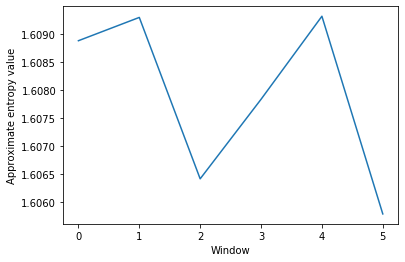

[ 95.  96.  96.  91.  86.  80.  72.  69.  71.  77.  92. 113. 126. 131.
 135. 134. 135. 141. 134. 137. 143. 144. 145. 145. 140. 129. 115. 103.
  85.  71.]
[1.608558603875585, 1.6079274599946072, 1.6005706522411258, 1.6092514502643334, 1.6093539134958825, 1.5879148047246052]


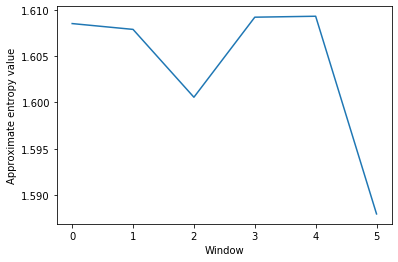

[113. 115. 115. 113. 112. 111. 119. 122. 124. 123. 124. 126. 135. 151.
 163. 174. 184. 191. 195. 198. 198. 201. 205. 213. 211. 206. 201. 194.
 186. 176.]
[1.6093821403099065, 1.6086544105875191, 1.6037436355232884, 1.6083876395256878, 1.6090518645167415, 1.6078879657065537]


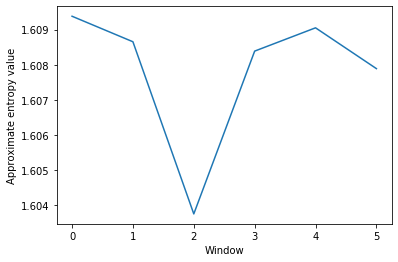

[ 90.  89.  84.  79.  77.  80.  81.  83.  84.  85.  88.  97. 109. 112.
 117. 123. 128. 133. 134. 132. 129. 124. 119. 113. 110. 107. 105. 102.
  99.  97.]
[1.6075140794296532, 1.609185484839941, 1.60421674569346, 1.6089487159345524, 1.6077310295294742, 1.6087841000573675]


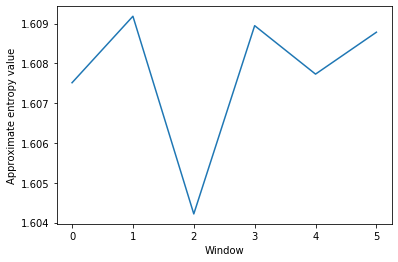

[148. 134. 116. 110. 100.  93.  89.  86.  85.  83.  80.  79.  80.  83.
  88.  93. 100. 107. 110. 113. 115. 115. 114. 111. 106.  97.  87.  79.
  73.  69.]
[1.599509963027311, 1.6086436550554346, 1.6086448377131937, 1.607021004215695, 1.6089661658398653, 1.6018519075911932]


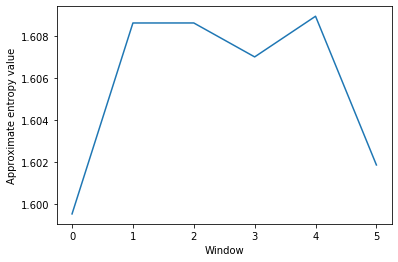

[185. 180. 175. 168. 159. 150. 147. 147. 143. 140. 137. 133. 131. 129.
 130. 136. 142. 145. 145. 141. 136. 131. 130. 132. 134. 132. 126. 115.
 102.  98.]
[1.6080409111183651, 1.6091476660894255, 1.609209609333837, 1.6091637966523384, 1.6093062430765068, 1.6028183368128675]


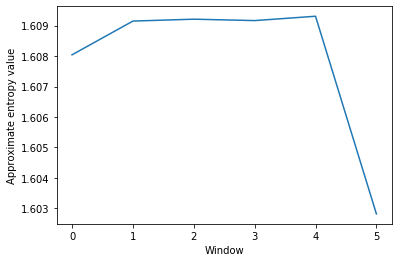

[111. 109. 109. 108. 107. 104. 113. 117. 114. 114. 115. 118. 121. 127.
 139. 155. 164. 164. 168. 171. 171. 173. 170. 167. 168. 169. 172. 176.
 182. 190.]
[1.6093636797815636, 1.6086565231490653, 1.607135166504726, 1.6088967233402156, 1.6093588759203454, 1.6085551582145827]


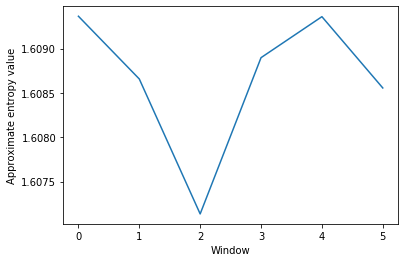

[198. 193. 182. 186. 187. 182. 161. 154. 153. 153. 148. 129. 109.  97.
  92.  93.  95.  99. 105. 110. 120. 124. 131. 136. 140. 142. 149. 158.
 162. 167.]
[1.6089957527235477, 1.6071093533885308, 1.5933063019346354, 1.607473426997836, 1.6078248860893272, 1.607753477951197]


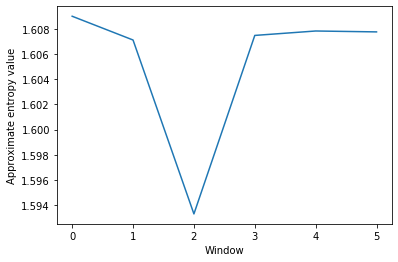

[100.  95.  91.  89.  92.  96. 103. 115. 126. 131. 132. 127. 121. 116.
 110. 105.  99.  95.  96.  97.  96.  95.  94.  91.  87.  84.  79.  78.
  78.  78.]
[1.6086060791066572, 1.6026535239369637, 1.6073724412106483, 1.6087929483466654, 1.6088120172993525, 1.609012207908607]


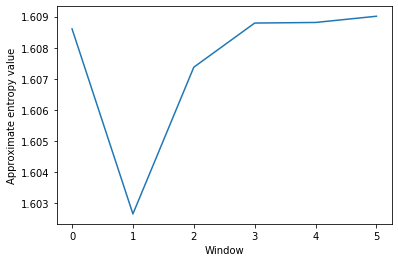

[ 99.  99. 101. 105. 109. 116. 124. 128. 128. 126. 126. 125. 124. 123.
 123. 125. 128. 133. 133. 132. 130. 127. 127. 128. 128. 126. 122. 111.
 107. 106.]
[1.608728752661739, 1.6087879317381004, 1.6093938790424753, 1.6091366578262556, 1.6094013855988274, 1.606941142879246]


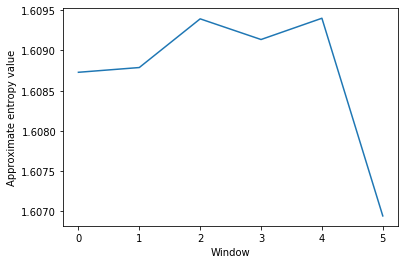

[ 77.  75.  74.  75.  75.  78.  79.  79.  78.  76.  74.  74.  75.  77.
  81.  89. 101. 109. 115. 120. 122. 124. 131. 139. 145. 150. 152. 156.
 160. 164.]
[1.6093533457156604, 1.6093388634438797, 1.608844935964912, 1.6041057038183903, 1.6072567138486875, 1.6089025985829315]


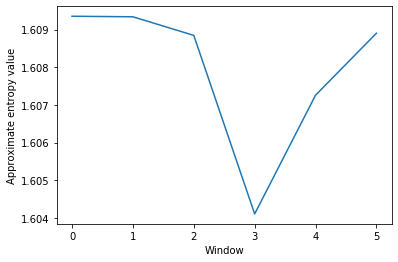

[ 63.  58.  52.  56.  63.  79. 105. 123. 143. 167. 177. 185. 195. 193.
 190. 188. 181. 166. 154. 144. 133. 118. 107. 100.  89.  79.  74.  65.
  55.  57.]
[1.6068050413627062, 1.5786086647108872, 1.6088447429298753, 1.604610064196886, 1.5999596606800521, 1.599457450704238]


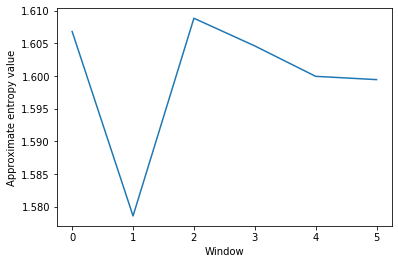

[197. 207. 209. 215. 234. 236. 245. 248. 251. 258. 263. 271. 268. 259.
 242. 232. 230. 237. 242. 245. 244. 242. 239. 239. 241. 243. 243. 239.
 234. 229.]
[1.607792346369577, 1.609010807646583, 1.6086666190218835, 1.6091486992530155, 1.6094069492476024, 1.6091762219909733]


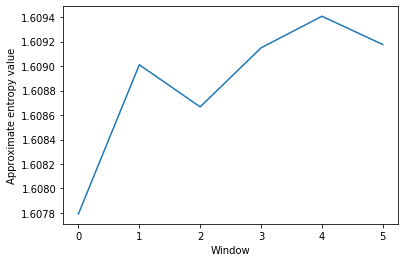

[134. 117. 109. 102.  91.  89.  95. 110. 105. 100. 102. 112. 113. 104.
 102. 108. 111. 114. 115. 123. 118. 107. 102.  98.  88.  85.  84.  89.
  88.  86.]
[1.6009326040978045, 1.606709027192948, 1.6083942111822815, 1.6084741160226679, 1.6047726277961765, 1.6092077364789261]


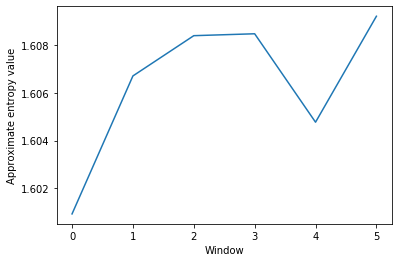

[ 99.  95.  93.  89.  85.  84.  85.  88.  97. 111. 117. 121. 124. 129.
 135. 137. 130. 123. 118. 119. 124. 134. 146. 154. 161. 169. 172. 175.
 175. 175.]
[1.6080598294685227, 1.6037053091591957, 1.6081877260914543, 1.6078173181836277, 1.6050813610144246, 1.6093415261793427]


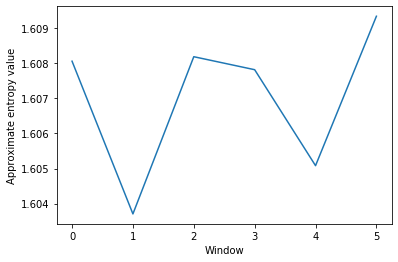

[ 60.  63.  67.  76.  89.  97. 106. 116. 127. 140. 154. 167. 182. 201.
 206. 210. 206. 192. 182. 169. 159. 148. 140. 136. 131. 127. 121. 114.
 106. 101.]
[1.5988306408469397, 1.6010848574872698, 1.603519696451773, 1.6062911963426327, 1.6070943942235305, 1.6059529204334213]


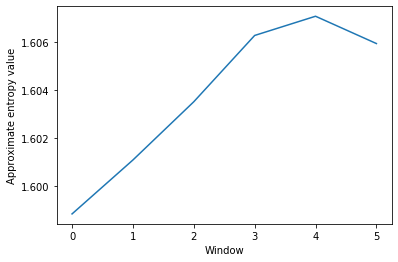

[131. 134. 144. 154. 162. 170. 181. 182. 191. 200. 207. 216. 234. 232.
 233. 235. 232. 229. 222. 205. 201. 190. 176. 167. 159. 154. 146. 142.
 139. 139.]
[1.6061774414049337, 1.6079430109575397, 1.6082396572352216, 1.6082830603810059, 1.6058242312866937, 1.6086839021061743]


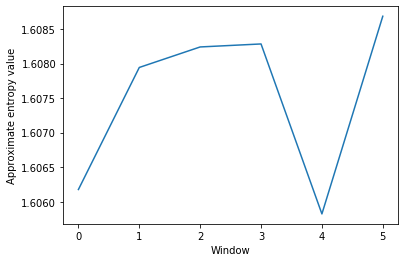

[ 58.  57.  64.  74.  78.  90. 102. 151. 188. 227. 235. 259. 277. 260.
 246. 237. 234. 234. 233. 239. 250. 249. 245. 239. 240. 244. 244. 241.
 235. 224.]
[1.6013563222284906, 1.5511924943177253, 1.6078971293909192, 1.6093925150522312, 1.6092686828805975, 1.608927622520455]


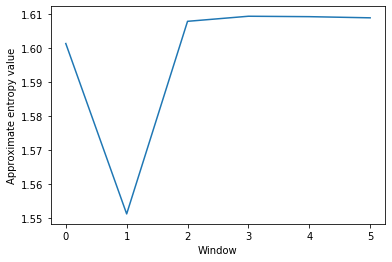

[ 58.  85. 101. 110. 123. 135. 136. 143. 153. 168. 179. 184. 187. 183.
 179. 178. 176. 169. 158. 156. 148. 142. 142. 145. 152. 156. 155. 157.
 156. 151.]
[1.580074688870921, 1.6059890132410706, 1.6092961576041216, 1.6079804740140946, 1.6090968696006138, 1.6093458497622803]


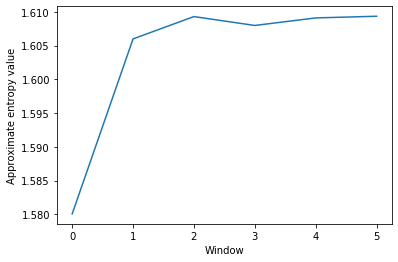

[109. 126. 153. 174. 189. 209. 211. 215. 221. 233. 240. 245. 244. 236.
 233. 229. 217. 204. 199. 195. 200. 201. 194. 183. 174. 173. 177. 181.
 177. 175.]
[1.5897794875544065, 1.6086597348817442, 1.6092544248991598, 1.6076546943846095, 1.6079307588238494, 1.6093252467251598]


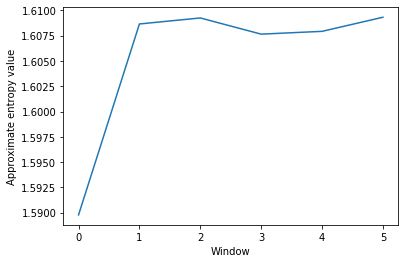

[111. 106. 102. 105. 108. 114. 129. 145. 150. 164. 183. 183. 184. 196.
 192. 193. 192. 191. 193. 199. 203. 207. 206. 209. 210. 216. 230. 228.
 234. 256.]
[1.6090389168369459, 1.601736531934332, 1.6090274586239977, 1.6093339372520934, 1.6093677831551392, 1.6078824502035847]


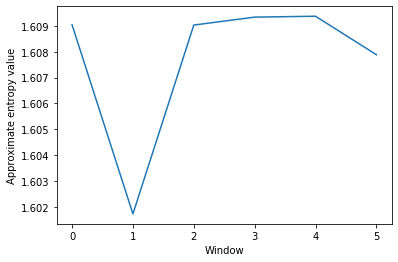

[ 80.  83.  85.  90. 100. 104. 107. 111. 118. 127. 134. 140. 148. 157.
 159. 167. 181. 193. 198. 197. 201. 204. 211. 221. 223. 227. 232. 242.
 254. 260.]
[1.606303049757181, 1.606814794360935, 1.607312051607905, 1.6074272901204796, 1.6085750422961371, 1.608104473625245]


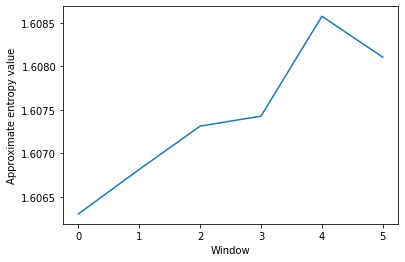

[ 96.  98.  97.  93.  96. 103. 115. 131. 165. 191. 203. 202. 199. 197.
 199. 201. 206. 208. 214. 217. 220. 218. 214. 203. 192. 188. 182. 173.
 167. 160.]
[1.6092853050485585, 1.5832185718345677, 1.6093779355598792, 1.6090658427115239, 1.6081667550204568, 1.6077661667990508]


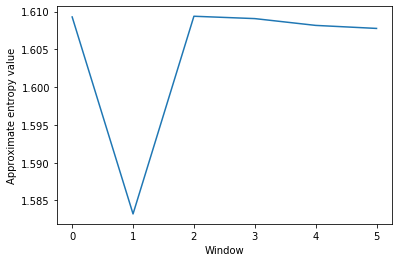

[114. 114. 113. 113. 127. 134. 139. 147. 157. 164. 170. 172. 168. 169.
 176. 186. 191. 190. 183. 176. 170. 167. 167. 166. 160. 151. 145. 137.
 131. 125.]
[1.6083744173627976, 1.60664477407083, 1.6093017042596607, 1.6090072488203166, 1.6092408201275843, 1.6071380760200031]


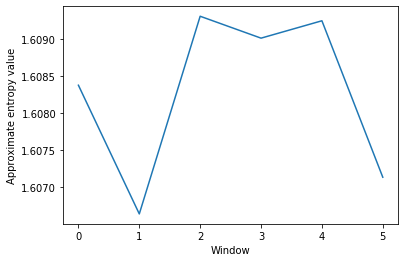

[131. 140. 156. 184. 196. 212. 222. 228. 238. 254. 250. 259. 259. 250.
 245. 242. 240. 235. 232. 233. 236. 242. 253. 261. 267. 277. 275. 276.
 276. 283.]
[1.5975157646208584, 1.6075190860938295, 1.6091978884035856, 1.609300002481047, 1.6083907509084343, 1.6093846128302585]


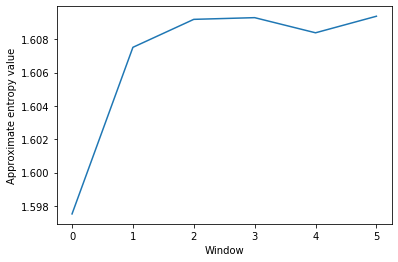

[ 98. 105. 112. 122. 133. 144. 153. 158. 163. 165. 161. 159. 156. 154.
 153. 151. 150. 158. 177. 189. 186. 175. 154. 137. 125. 116. 108. 103.
  96.  94.]
[1.6035810542106008, 1.608263707158944, 1.6092538827198137, 1.6051248976030534, 1.598691661152448, 1.6064358021685854]


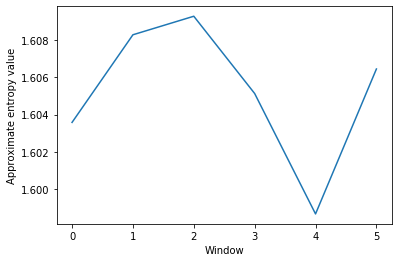

[63. 68. 70. 81. 80. 76. 77. 86. 96. 98. 92. 83. 74. 69. 67. 62. 64. 66.
 68. 69. 68. 67. 69. 69. 65. 61. 60. 61. 61. 61.]
[1.6047624688410334, 1.6037934829379985, 1.6022384232510478, 1.608678009273746, 1.609191458711397, 1.609416199460123]


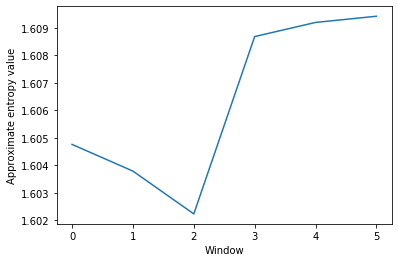

[118. 117. 116. 117. 120. 125. 132. 139. 144. 147. 154. 166. 171. 176.
 181. 186. 196. 205. 211. 220. 231. 233. 244. 250. 258. 260. 266. 269.
 273. 276.]
[1.6093715776064377, 1.6077234435400012, 1.6079298249585667, 1.6077597092871083, 1.608561947264416, 1.6092231979162117]


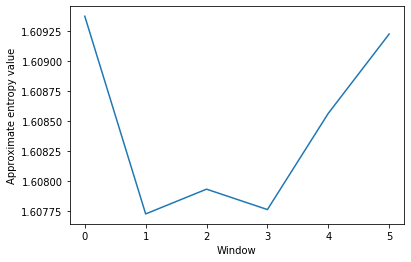

[ 40.  40.  47.  51.  59.  79.  77.  81.  94.  99. 109. 121. 127. 142.
 150. 143. 138. 134. 135. 138. 155. 175. 192. 211. 226. 239. 208. 213.
 215. 213.]
[1.5981651619416049, 1.6042588039136532, 1.6030412352645818, 1.6091792049200218, 1.6007288997140752, 1.6081990486206972]


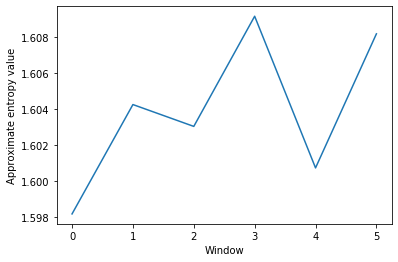

[139. 147. 156. 164. 173. 183. 197. 209. 216. 225. 235. 244. 246. 250.
 241. 231. 219. 210. 205. 197. 191. 188. 185. 185. 187. 187. 185. 183.
 180. 180.]
[1.6064570739787682, 1.6068697261287461, 1.6092229744738185, 1.6079224205440934, 1.6093673136573734, 1.6093245338200532]


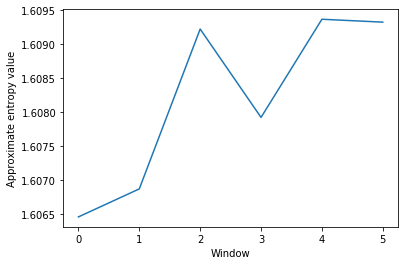

[132. 139. 143. 151. 172. 197. 206. 215. 220. 222. 218. 239. 248. 262.
 274. 267. 257. 241. 236. 228. 222. 210. 183. 166. 154. 145. 138. 135.
 141. 148.]
[1.6051837972304475, 1.6084645263960653, 1.606405740253514, 1.6077729395336162, 1.6000079198392971, 1.6088919709145695]


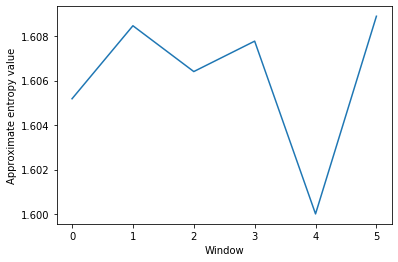

[120. 139. 160. 179. 210. 257. 259. 246. 253. 244. 241. 261. 257. 270.
 281. 276. 268. 255. 243. 235. 222. 211. 195. 156. 139. 144. 143. 144.
 145. 149.]
[1.590783176129279, 1.6091618606867484, 1.6081335367197118, 1.607669106395991, 1.5941072705861452, 1.6093338553485896]


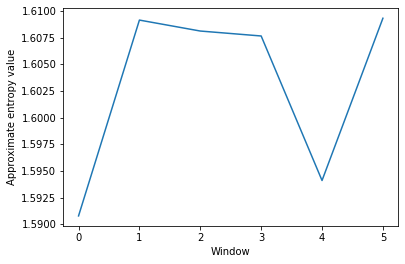

[107.  99.  96.  96.  95. 102. 108. 113. 129. 143. 158. 168. 176. 183.
 191. 194. 191. 183. 179. 181. 188. 194. 200. 204. 209. 214. 217. 217.
 212. 206.]
[1.6084549997736755, 1.6016457664049097, 1.6072823722016776, 1.6089426212670395, 1.6087493878271464, 1.609254815183242]


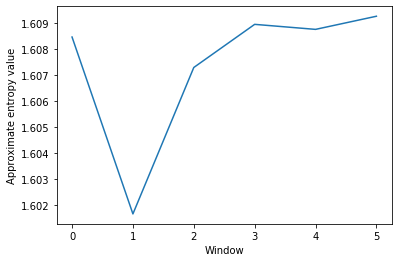

[130. 130. 132. 134. 135. 135. 131. 128. 127. 131. 146. 174. 188. 193.
 202. 208. 217. 237. 252. 266. 280. 290. 299. 305. 305. 300. 300. 312.
 338. 339.]
[1.6093189848101397, 1.6092080166354845, 1.6033941379369612, 1.6053018802275152, 1.608905527128598, 1.6079337798372118]


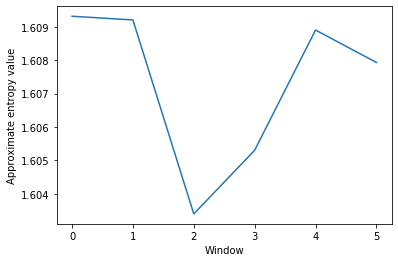

[212. 228. 235. 244. 254. 261. 270. 278. 281. 275. 266. 256. 240. 225.
 214. 203. 195. 190. 187. 181. 175. 173. 169. 158. 157. 162. 169. 175.
 178. 177.]
[1.6075742047914072, 1.609105942939301, 1.6062551649314003, 1.6086830433999078, 1.6084111899021276, 1.6088296853989044]


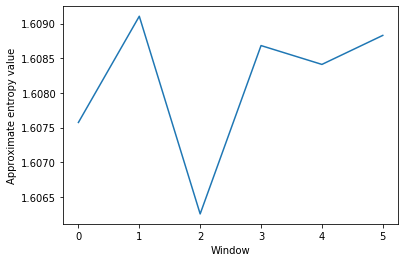

[ 84.  80.  73.  70.  71.  69.  67.  66.  69.  77.  94. 107. 114. 112.
 108. 103. 104. 107. 106. 105. 104. 106. 115. 125. 132. 138. 132. 124.
 112.  90.]
[1.6068539329371276, 1.6079170384236288, 1.6072554122189167, 1.6093472048236273, 1.6051689645827363, 1.5988639550135137]


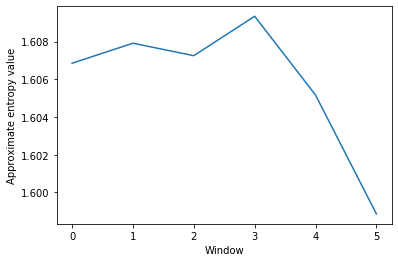

[141. 133. 128. 128. 129. 124. 107.  96.  89.  90.  95.  96.  93.  90.
  86.  85.  84.  82.  84.  85.  88.  93.  98. 102. 110. 114. 113. 111.
 111. 108.]
[1.6087400347712588, 1.6013261296842143, 1.60865209436631, 1.6093525348852729, 1.6064965256779982, 1.6092666333703343]


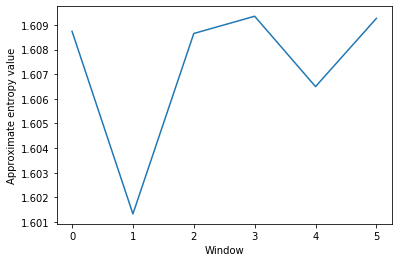

[ 95. 100. 102. 106. 117. 140. 157. 169. 172. 183. 196. 204. 214. 224.
 230. 239. 240. 246. 256. 259. 261. 264. 267. 272. 278. 281. 281. 281.
 276. 268.]
[1.6069414181080255, 1.6053849493928907, 1.6077258136812436, 1.608896027857132, 1.6091870977304161, 1.60926890628225]


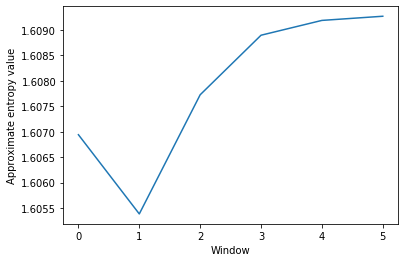

[233. 235. 234. 234. 239. 248. 255. 257. 258. 260. 261. 263. 264. 261.
 254. 250. 246. 240. 227. 219. 214. 208. 206. 203. 197. 192. 189. 184.
 180. 179.]
[1.6093982126176458, 1.60930681188881, 1.6093473475480733, 1.6082115129363541, 1.609065750616209, 1.6090672999085749]


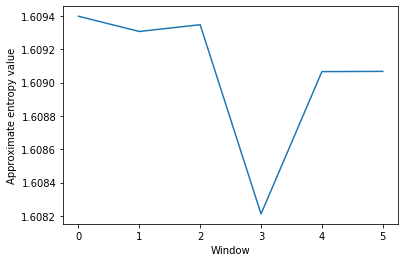

[208. 209. 207. 207. 208. 208. 208. 208. 210. 215. 222. 227. 228. 224.
 219. 216. 214. 213. 214. 215. 213. 209. 208. 209. 211. 213. 214. 215.
 215. 215.]
[1.6094314307255444, 1.6093547444956888, 1.6093301601901406, 1.6094266048465242, 1.609401695190881, 1.609430943633428]


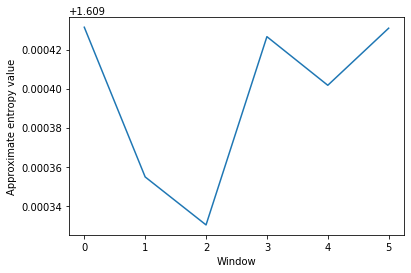

[114. 108. 105.  99.  96.  91.  87.  88.  95. 112. 131. 143. 152. 160.
 166. 170. 170. 169. 167. 162. 161. 166. 175. 177. 178. 183. 197. 209.
 219. 225.]
[1.6075585381562694, 1.6049346287093404, 1.6060006139235763, 1.6092759472597291, 1.6086659283015619, 1.6067236709416934]


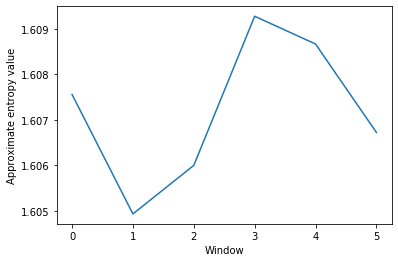

[309. 325. 341. 355. 362. 328. 312. 309. 299. 289. 293. 303. 305. 305.
 310. 304. 283. 262. 240. 225. 234. 257. 257. 251. 247. 241. 238. 234.
 228. 212.]
[1.6077832165745911, 1.6085325359808411, 1.6092664432073236, 1.6035708601221756, 1.6088511186900682, 1.608432393702849]


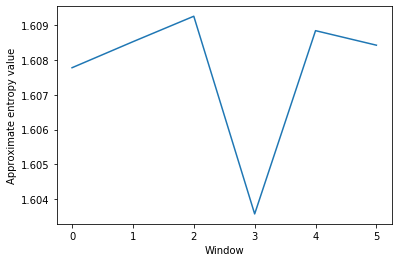

[132. 131. 141. 146. 152. 159. 165. 169. 172. 174. 181. 202. 201. 199.
 192. 185. 186. 189. 188. 180. 174. 165. 165. 167. 167. 170. 175. 176.
 175. 181.]
[1.6077905926267733, 1.6089278384769155, 1.6086230139685753, 1.60929443001822, 1.6092429670719208, 1.6092390665368312]


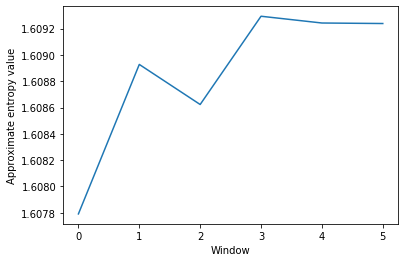

[110. 116. 124. 124. 123. 123. 145. 159. 176. 186. 196. 208. 213. 222.
 217. 207. 200. 196. 191. 184. 175. 172. 171. 169. 168. 165. 160. 157.
 157. 159.]
[1.6083361981725677, 1.59918849961371, 1.6085448567121454, 1.6086393828347358, 1.6093355099049116, 1.609269293360343]


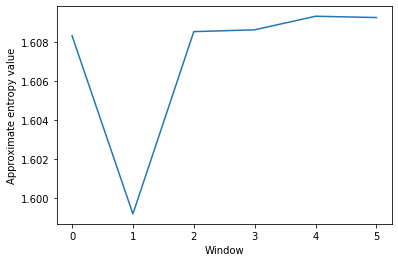

[154. 158. 162. 166. 169. 187. 194. 196. 196. 196. 194. 192. 190. 191.
 198. 204. 203. 202. 203. 205. 206. 205. 205. 203. 194. 182. 171. 162.
 154. 144.]
[1.6088839875321734, 1.6092747111295305, 1.6093309357094145, 1.6094253490145356, 1.6091987709602633, 1.6061577916779202]


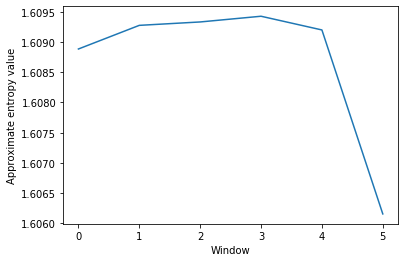

[127. 126. 126. 126. 126. 129. 132. 134. 135. 135. 139. 151. 172. 170.
 163. 150. 141. 138. 139. 142. 142. 140. 136. 134. 135. 136. 136. 135.
 135. 136.]
[1.6094328972737233, 1.609290232662088, 1.606345637791212, 1.6089962853959252, 1.609188623972866, 1.6094313829865825]


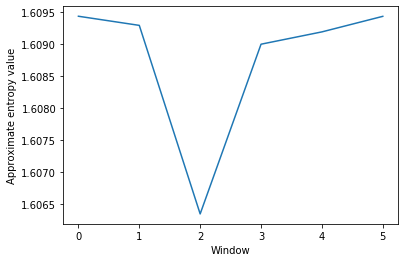

[204. 202. 196. 189. 193. 192. 187. 185. 185. 183. 179. 172. 165. 163.
 173. 175. 170. 161. 153. 146. 144. 151. 161. 176. 185. 190. 189. 181.
 177. 172.]
[1.6090380727297329, 1.6093027245245375, 1.6088625350093355, 1.60724854916997, 1.605101170714714, 1.608714428728237]


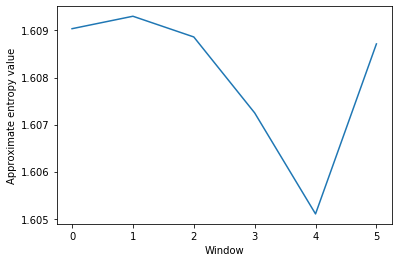

[180. 178. 178. 176. 174. 176. 181. 180. 174. 159. 148. 151. 162. 173.
 188. 182. 173. 154. 142. 132. 126. 128. 127. 125. 120. 110. 106. 101.
  95.  91.]
[1.609371598173633, 1.608381982726317, 1.605465683323899, 1.6023451358010568, 1.60918842168401, 1.6070492631234037]


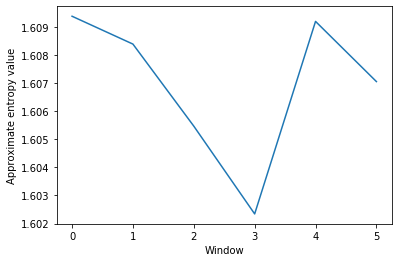

[139. 139. 137. 136. 135. 134. 130. 127. 118. 115. 111. 108. 104. 100.
 100.  97.  88.  78.  71.  67.  69.  70.  67.  61.  59.  60.  64.  69.
  74.  78.]
[1.6093699020727126, 1.6077693552578716, 1.608570535607168, 1.600094669601266, 1.607141442210664, 1.604974430757584]


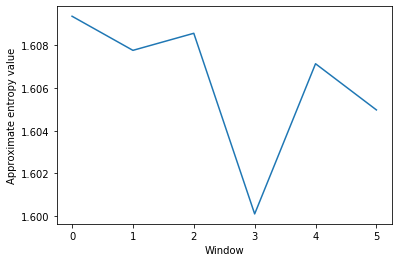

[123. 122. 124. 129. 129. 128. 108. 109. 112. 117. 126. 140. 154. 152.
 152. 144. 137. 128. 116. 107. 100.  95.  91.  90.  91.  93.  93.  89.
  82.  74.]
[1.609151073920639, 1.6074496237925777, 1.60668111814517, 1.6037002751359866, 1.6086534036717857, 1.605774127678125]


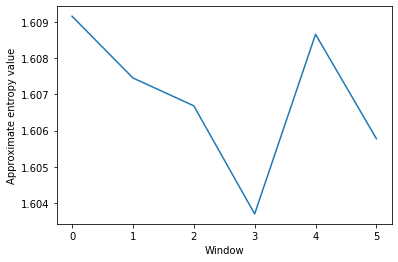

[249. 244. 243. 249. 257. 260. 261. 265. 281. 283. 279. 265. 250. 247.
 250. 249. 244. 241. 241. 240. 240. 237. 238. 234. 230. 228. 222. 216.
 210. 199.]
[1.6092390725088908, 1.6087601763380843, 1.6083421281876622, 1.6093468605188241, 1.6093282640395319, 1.6083498384148975]


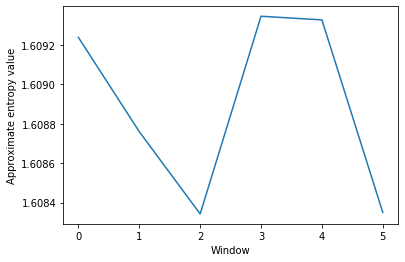

[191. 185. 181. 165. 163. 157. 152. 138. 133. 131. 134. 143. 157. 169.
 162. 161. 159. 158. 153. 147. 146. 147. 145. 135. 125. 120. 120. 120.
 119. 119.]
[1.6074630111315353, 1.6067726793772819, 1.6059262967155306, 1.6089084285957527, 1.60756314011359, 1.6094295185625374]


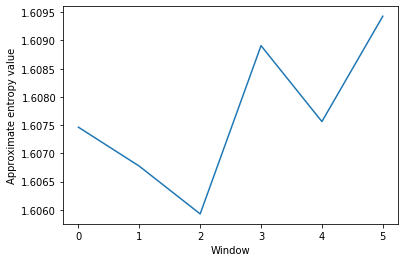

[183. 193. 203. 210. 212. 217. 216. 210. 204. 202. 205. 213. 230. 248.
 250. 246. 233. 216. 199. 186. 178. 171. 164. 157. 149. 139. 137. 132.
 132. 132.]
[1.607950725513781, 1.6090177782266202, 1.6063138077578496, 1.6043272506638409, 1.6074996817741045, 1.6091886606305574]


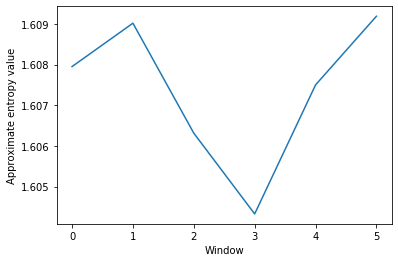

[182. 180. 178. 176. 176. 177. 175. 174. 170. 167. 166. 169. 172. 177.
 180. 180. 179. 177. 175. 174. 173. 171. 164. 152. 144. 140. 134. 129.
 134. 135.]
[1.609352580546786, 1.6092184325229952, 1.6090002670368044, 1.6093549189387275, 1.607006032262527, 1.6090992619457827]


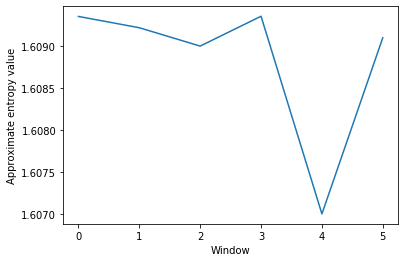

[232. 221. 215. 212. 209. 212. 217. 216. 205. 197. 191. 191. 192. 195.
 198. 204. 208. 205. 202. 200. 199. 191. 173. 164. 158. 151. 140. 137.
 132. 130.]
[1.6087466636119623, 1.6087918209056051, 1.609338777831169, 1.609349365675994, 1.6055430799156976, 1.6080163603399487]


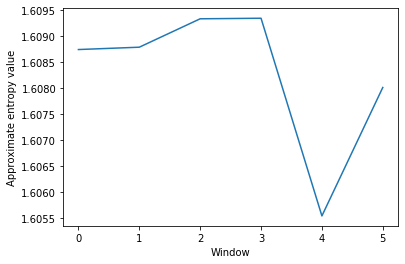

[125. 123. 119. 115. 114. 113. 107.  94.  95.  95.  98. 100.  98.  98.
 100. 107. 109. 106.  98.  94.  86.  84.  88.  89.  86.  83.  84.  87.
  90.  90.]
[1.608785287144858, 1.6065170860487465, 1.6093888047855613, 1.6078445283552114, 1.60923513530345, 1.6088691227355376]


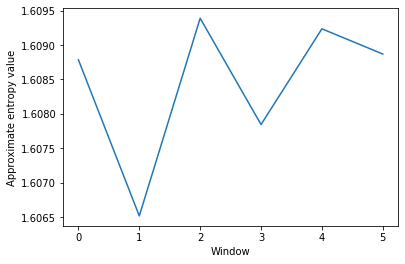

[265. 272. 280. 288. 298. 306. 304. 307. 304. 302. 283. 255. 241. 217.
 184. 156. 134. 117.  97.  88.  82.  76.  73.  49.  47.  48.  53.  65.
  81.  93.]
[1.6085818134852028, 1.6094215279385686, 1.5991123936139342, 1.5878731462275906, 1.5840079286065625, 1.5787678915020364]


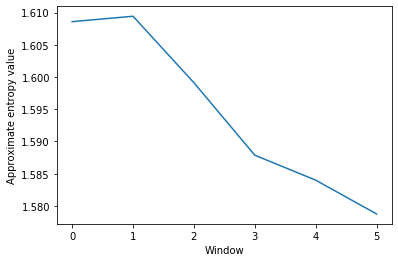

[116. 108. 101. 102. 107. 106. 111. 113. 113. 114. 110.  96.  82.  77.
  83.  94. 117. 121. 130. 131. 128. 128. 124. 123. 123. 119. 110. 105.
 109. 113.]
[1.6081978630404556, 1.6091026430376796, 1.6007351234337395, 1.6027912896882817, 1.6092672830488823, 1.608563050794739]


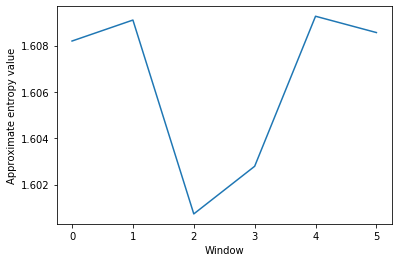

[ 97.  96.  95.  97. 102. 108. 112. 113. 115. 121. 136. 145. 146. 142.
 135. 134. 134. 135. 132. 126. 120. 123. 130. 140. 149. 152. 155. 157.
 161. 160.]
[1.6091329364961102, 1.6087403279612338, 1.6089181840712947, 1.6091327573504466, 1.6061490874248412, 1.6092184478069786]


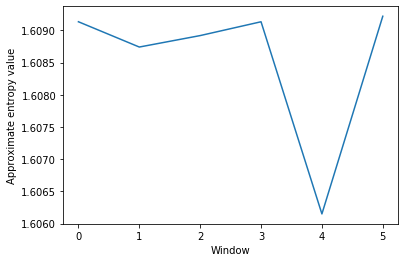

[232. 230. 229. 226. 215. 202. 168. 154. 143. 135. 140. 149. 159. 173.
 172. 165. 147. 111. 120. 122. 117. 112. 109. 102.  94.  86.  77.  77.
  80.  83.]
[1.6090807146148738, 1.5989719477632172, 1.6061357023861438, 1.5984005408257158, 1.6065754651629276, 1.6085003245662932]


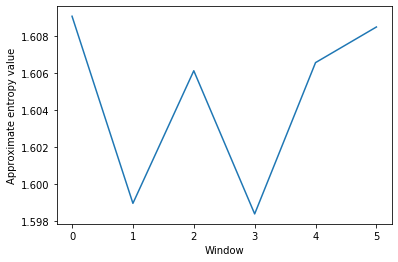

[ 81.  82.  84.  88.  91.  91.  88.  85.  84.  84.  86.  89.  93. 103.
 113. 112. 112. 107. 104. 100.  94.  90.  86.  80.  77.  76.  77.  79.
  81.  84.]
[1.608467924499206, 1.6089431026550614, 1.6042622485567932, 1.6084908505090216, 1.606756857262465, 1.6087873529272523]


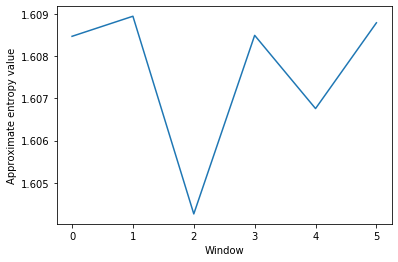

[187. 193. 200. 203. 203. 198. 189. 184. 176. 168. 168. 168. 170. 174.
 179. 191. 205. 206. 209. 206. 202. 200. 202. 202. 199. 194. 188. 179.
 172. 173.]
[1.6089285466807048, 1.6078351374172635, 1.6091387558761496, 1.6089446372656366, 1.6094180861101797, 1.6083261416104837]


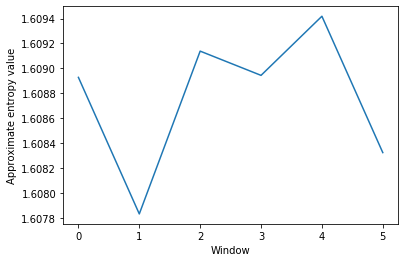

[216. 219. 217. 226. 219. 217. 204. 195. 191. 186. 181. 175. 162. 156.
 156. 153. 149. 148. 147. 143. 145. 140. 128. 116. 104.  96.  94.  93.
  90.  95.]
[1.6093114983124015, 1.6079388972274562, 1.6075567987843409, 1.609200469360856, 1.6022092510904036, 1.6091946552994403]


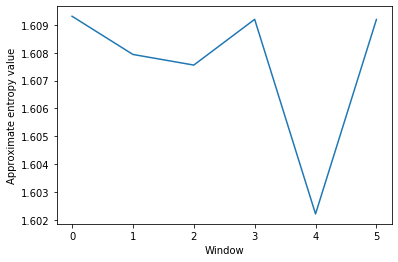

[161. 146. 135. 129. 123. 116. 115. 113. 111. 115. 121. 129. 139. 143.
 144. 139. 136. 132. 124. 111.  99.  95.  92.  91.  89.  81.  73.  71.
  72.  76.]
[1.6048073488431638, 1.6093143826671057, 1.6072607829199783, 1.606308612993133, 1.6087423488186043, 1.6082811369812133]


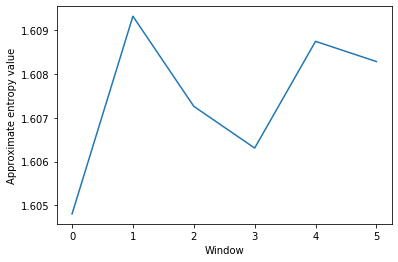

[101. 107. 115. 119. 126. 134. 138. 145. 151. 157. 162. 168. 174. 184.
 190. 193. 198. 203. 200. 201. 205. 212. 217. 224. 230. 235. 241. 242.
 244. 244.]
[1.6064272845550895, 1.6077747152755886, 1.6077434842714864, 1.6092908254891203, 1.608623984088697, 1.6093432492041075]


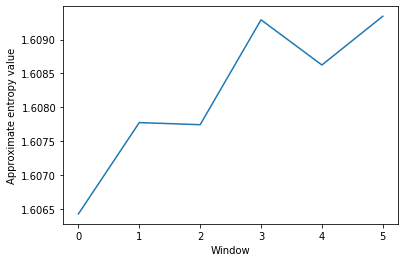

[199. 198. 195. 188. 173. 187. 205. 219. 216. 214. 213. 206. 199. 195.
 190. 183. 175. 174. 167. 143. 123. 138. 158. 157. 161. 175. 180. 184.
 190. 195.]
[1.6081458784938991, 1.6078601529766874, 1.60862230359767, 1.606040249075239, 1.6043702616833049, 1.6087040136034492]


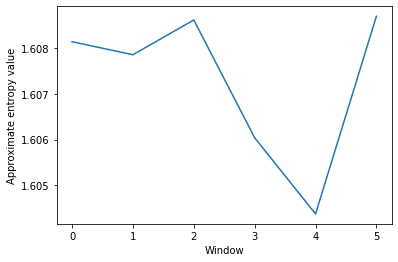

[100. 101.  95.  90.  90.  92.  92.  90.  88.  84.  85.  93. 119. 145.
 150. 162. 155. 140. 127. 114. 106.  97.  87.  89.  95.  93.  89.  84.
  80.  81.]
[1.6082156774220175, 1.6088700298593737, 1.5843605333457904, 1.6013855473287828, 1.606961632197465, 1.607787495255253]


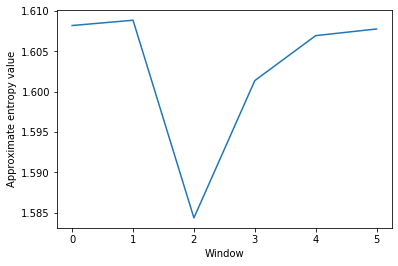

[185. 179. 172. 140. 131. 132. 133. 134. 137. 144. 158. 183. 195. 198.
 196. 191. 189. 192. 201. 214. 223. 225. 223. 213. 203. 195. 193. 193.
 196. 199.]
[1.60019141870173, 1.6089349702205735, 1.606100456690451, 1.6083512190007934, 1.6086955204157833, 1.609372975586687]


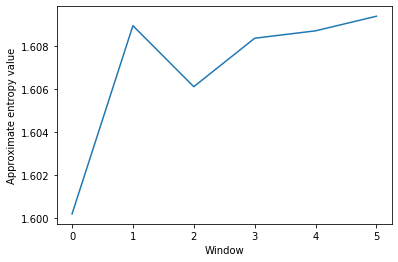

[ 86.  84.  79.  83.  82.  77.  76.  75.  71.  72.  77.  93. 130. 149.
 166. 166. 161. 148. 132. 109.  94.  95.  88.  80.  74.  70.  68.  76.
  85.  92.]
[1.6090456654960363, 1.608949793877496, 1.571277192427214, 1.5985820313584787, 1.6049558822602836, 1.6027565864626543]


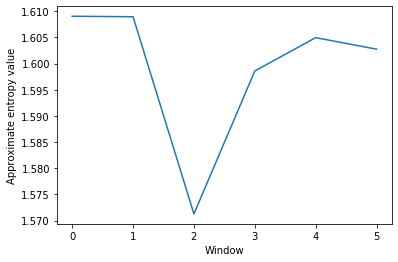

[142. 150. 158. 163. 161. 166. 167. 165. 160. 156. 149. 142. 143. 150.
 169. 203. 203. 205. 201. 189. 182. 173. 171. 168. 161. 152. 146. 141.
 147. 155.]
[1.608160843866111, 1.6091086580139407, 1.607398028823988, 1.609021367146903, 1.608639267345774, 1.608896665970405]


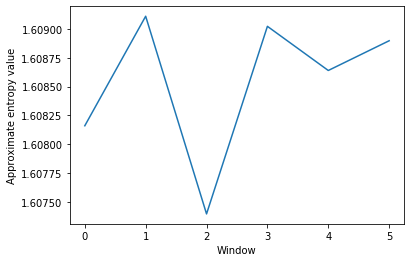

[136. 136. 139. 140. 142. 143. 140. 135. 130. 130. 131. 132. 129. 120.
 118. 119. 120. 117. 104.  93.  91.  85.  79.  80.  86.  90.  91.  94.
  99.  97.]
[1.6092963960585123, 1.608693344724896, 1.6083606160455761, 1.6048020131689702, 1.6081056353657135, 1.608776087574188]


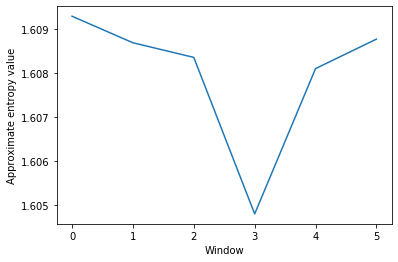

[217. 220. 214. 204. 202. 196. 195. 195. 187. 177. 173. 169. 179. 194.
 221. 232. 239. 235. 226. 219. 207. 198. 190. 185. 176. 164. 161. 155.
 157. 150.]
[1.6088652869584694, 1.6086976529457253, 1.6044650194163534, 1.6089701848926536, 1.6078884080721687, 1.6089639846279837]


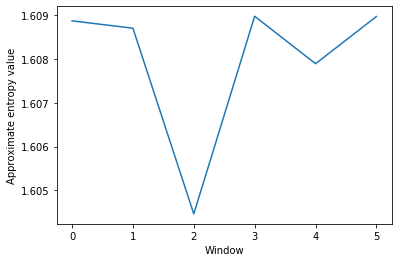

[152. 155. 158. 162. 161. 157. 151. 150. 145. 150. 161. 169. 179. 182.
 174. 169. 161. 147. 139. 131. 129. 136. 138. 134. 132. 131. 134. 139.
 149. 160.]
[1.6091586779549314, 1.609115921453814, 1.6085030515084133, 1.6050942321401944, 1.609164837184617, 1.606691701955355]


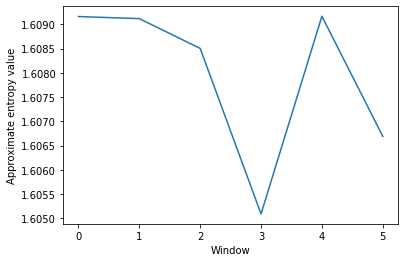

[175. 172. 170. 169. 169. 166. 159. 161. 167. 176. 188. 187. 180. 170.
 157. 149. 145. 145. 141. 137. 139. 138. 141. 140. 136. 132. 132. 133.
 137. 141.]
[1.609349310584629, 1.6088064113680882, 1.6072295171606408, 1.6090321637940208, 1.6093609613344877, 1.6090998419865001]


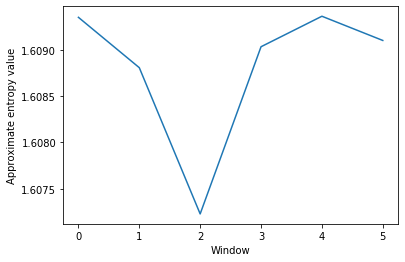

[195. 201. 199. 189. 181. 202. 213. 208. 187. 154. 154. 149. 136. 146.
 166. 169. 177. 183. 185. 192. 204. 219. 225. 229. 223. 210. 205. 202.
 195. 192.]
[1.6087239468671044, 1.6031024576058448, 1.6072960586159608, 1.608518014071267, 1.6086587115868656, 1.6089049422851902]


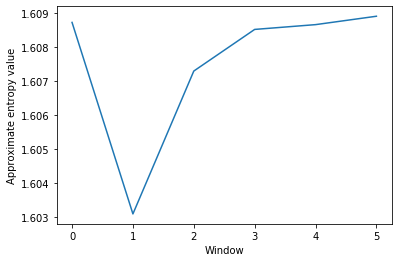

[205. 203. 209. 216. 213. 214. 203. 190. 188. 188. 190. 194. 217. 224.
 213. 206. 206. 203. 195. 189. 181. 155. 149. 155. 158. 159. 157. 157.
 152. 133.]
[1.6091712015222017, 1.608069514150511, 1.6073817677733346, 1.6088659948117232, 1.6070863371638247, 1.6073809789741489]


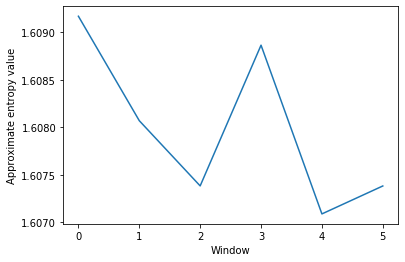

[142. 138. 141. 152. 149. 147. 140. 136. 129. 125. 126. 133. 158. 172.
 179. 183. 185. 176. 171. 164. 157. 150. 146. 139. 130. 133. 132. 130.
 123. 116.]
[1.6087821554732937, 1.607775244541044, 1.6000539534535976, 1.6084668782752702, 1.6073661256131424, 1.6081358562144095]


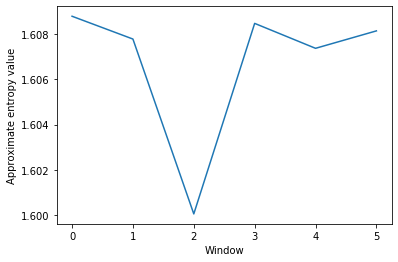

[152. 150. 149. 149. 148. 150. 134. 126. 123. 123. 128. 145. 168. 180.
 182. 179. 169. 158. 143. 135. 128. 122. 123. 131. 135. 137. 137. 137.
 136. 137.]
[1.609396896461231, 1.6064737477773796, 1.6007162766109504, 1.6040980069548592, 1.608711870060611, 1.609433631344896]


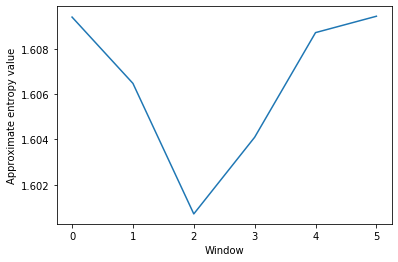

[117. 114. 112. 111. 110. 110. 114. 115. 115. 113. 110. 113. 125. 152.
 166. 173. 182. 184. 178. 169. 162. 156. 150. 145. 139. 134. 130. 128.
 127. 127.]
[1.6091969116821097, 1.6093034370748767, 1.595874215660107, 1.6089435904807736, 1.6080000115706354, 1.6092307646265012]


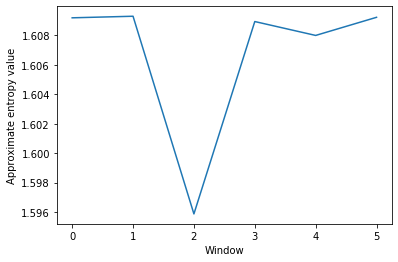

[166. 217. 229. 235. 244. 251. 245. 230. 210. 206. 215. 224. 228. 225.
 218. 210. 203. 193. 174. 154. 143. 137. 127. 122. 126. 131. 138. 148.
 154. 154.]
[1.6010262642979605, 1.6063067382201648, 1.6092060967851143, 1.6033533927365289, 1.607691698720436, 1.6074396880249755]


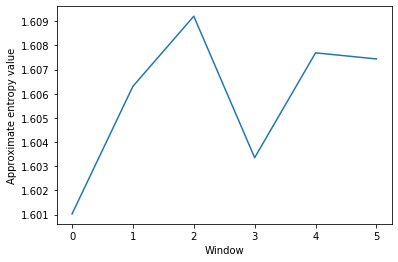

[153. 155. 156. 154. 150. 152. 160. 165. 165. 159. 152. 151. 158. 174.
 172. 164. 143. 125. 114. 104.  93.  88.  81.  75.  73.  82.  93. 114.
 117. 124.]
[1.609347770761486, 1.608987758371412, 1.6076064665088703, 1.5961302550730703, 1.6051744236377232, 1.5979739522777596]


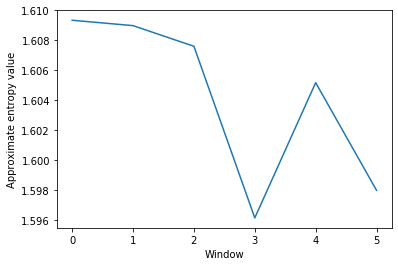

[191. 179. 169. 168. 173. 175. 177. 172. 166. 164. 169. 179. 186. 186.
 180. 174. 168. 167. 167. 162. 158. 149. 152. 161. 167. 168. 165. 162.
 153. 149.]
[1.608303087912861, 1.609002428982421, 1.608833721269818, 1.6091778734439948, 1.6086108107949575, 1.6084047922156786]


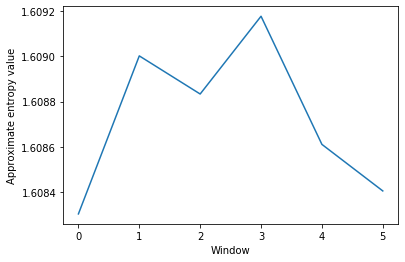

[283. 277. 283. 302. 316. 320. 326. 317. 309. 304. 297. 292. 298. 298.
 301. 303. 301. 286. 275. 279. 284. 284. 275. 265. 259. 255. 249. 242.
 235. 224.]
[1.6082047539679203, 1.6091287709967923, 1.6093893469914509, 1.6086660683172478, 1.608759871105514, 1.6084238779542697]


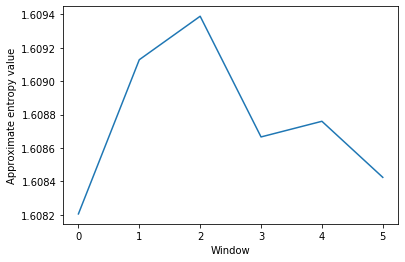

[ 80.  81.  81.  80.  79.  78.  78.  75.  73.  72.  76.  90. 124. 136.
 146. 143. 145. 149. 158. 165. 169. 165. 161. 157. 154. 150. 151. 154.
 156. 156.]
[1.6093943326690359, 1.6088931719755646, 1.5806754432049206, 1.6079602848910612, 1.6088811606338278, 1.6093051527270394]


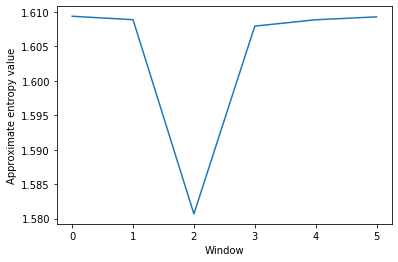

[144. 142. 141. 139. 137. 134. 129. 128. 127. 125. 125. 130. 148. 164.
 174. 178. 183. 180. 170. 158. 156. 152. 137. 130. 125. 118. 113. 108.
 102.  96.]
[1.6092900846908011, 1.6091662105816045, 1.6013071995665336, 1.6080779692250993, 1.6057039652433642, 1.6067980292076234]


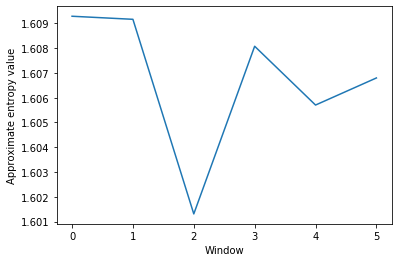

[226. 226. 227. 229. 229. 233. 235. 233. 230. 233. 244. 268. 280. 289.
 284. 272. 256. 236. 224. 215. 209. 207. 208. 207. 200. 192. 183. 176.
 167. 161.]
[1.609420128519935, 1.6094142641001143, 1.6076711412175098, 1.6057044013709385, 1.6093176237259903, 1.607463703189016]


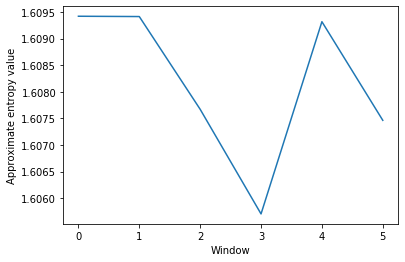

[110. 109. 107. 105. 104. 103. 102. 101.  98.  96.  95.  99. 108. 125.
 137. 149. 159. 168. 170. 175. 174. 171. 167. 163. 161. 164. 169. 174.
 173. 168.]
[1.609210793690756, 1.6090966499537045, 1.5996252685263705, 1.6078519815428092, 1.6090204284042209, 1.609210832211291]


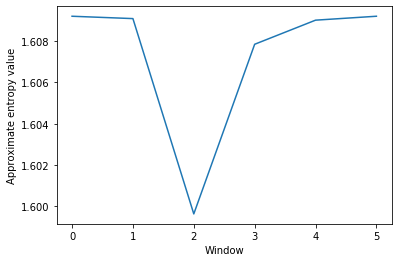

[127. 127. 127. 127. 129. 132. 134. 133. 130. 128. 129. 133. 140. 148.
 155. 160. 165. 167. 169. 170. 175. 185. 195. 193. 194. 193. 194. 201.
 213. 217.]
[1.6094182582666372, 1.6093032371006637, 1.607161656683157, 1.6092093406735588, 1.6086188878322396, 1.6082858328165681]


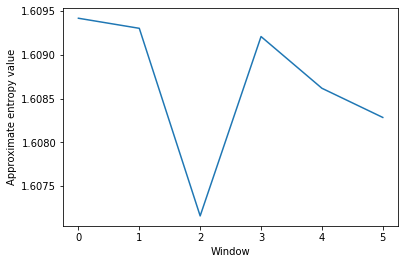

[388. 400. 400. 396. 395. 393. 345. 323. 304. 287. 284. 288. 293. 296.
 305. 304. 302. 299. 291. 258. 263. 268. 262. 254. 251. 247. 238. 233.
 223. 213.]
[1.6093759429482286, 1.6033499934926305, 1.6091377891968572, 1.6076866893347308, 1.6091508735584457, 1.6081247715971232]


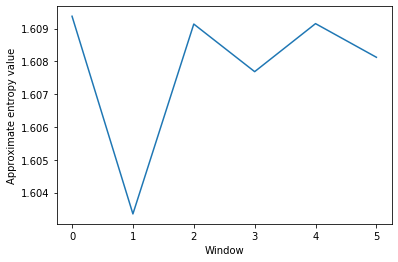

[142. 142. 142. 142. 143. 142. 143. 145. 147. 152. 164. 176. 182. 191.
 198. 204. 212. 219. 226. 232. 235. 238. 238. 235. 233. 231. 228. 227.
 227. 226.]
[1.6094339616672593, 1.6091441759282228, 1.6073271001443885, 1.608407510256483, 1.6094040956211835, 1.6094094644970152]


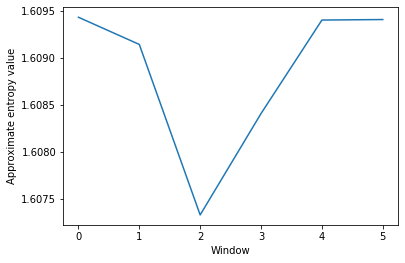

[ 98.  99. 101. 108. 107. 107. 113. 113. 117. 127. 138. 152. 163. 169.
 163. 154. 157. 157. 159. 160. 158. 153. 152. 156. 158. 160. 161. 163.
 161. 162.]
[1.6086311900229187, 1.6078103034786517, 1.606949582743769, 1.6093521845781444, 1.6093085502272022, 1.6094179619483158]


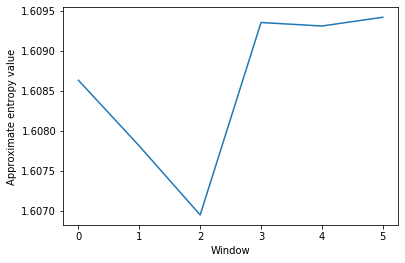

[ 62.  64.  66.  68.  74.  92. 110. 117. 117. 119. 120. 133. 150. 157.
 162. 164. 152. 131. 118. 108. 100.  94.  91.  93.  96.  98.  97.  94.
  93.  93.]
[1.6075619419867526, 1.6052351664516158, 1.6034490515671924, 1.5975258038088918, 1.6089201434896165, 1.6091948185937355]


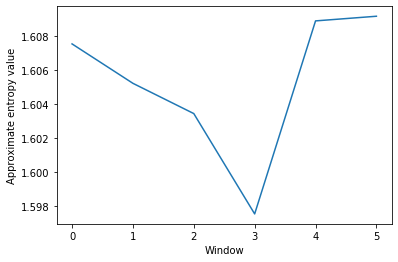

[ 96.  99.  99.  96.  91.  92.  90.  89.  90.  92. 101. 128. 140. 150.
 146. 137. 129. 126. 121. 109. 103. 103. 103.  99.  93.  94.  92.  93.
  94.  92.]
[1.6089716397907785, 1.6093502364264523, 1.6002098285779047, 1.6066180952196016, 1.6086622380319013, 1.6093916634216854]


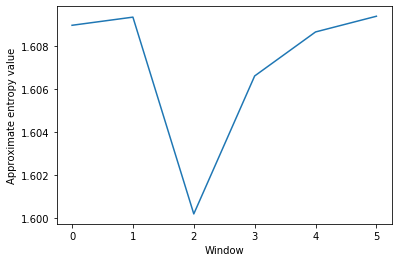

[126. 133. 142. 148. 149. 172. 182. 172. 167. 170. 173. 181. 197. 207.
 209. 199. 186. 171. 166. 168. 160. 132. 118. 110. 105.  97.  96. 104.
 108. 110.]
[1.6074013196510244, 1.6090149019247406, 1.6067122576712976, 1.6069552481197609, 1.5974042466812535, 1.6079260121724261]


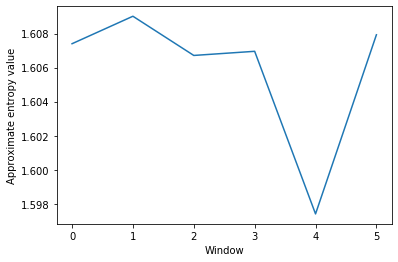

[ 91.  89.  85.  86.  83.  95. 101. 109. 117. 123. 129. 134. 142. 137.
 136. 147. 145. 145. 143. 141. 138. 136. 135. 131. 132. 131. 135. 143.
 148. 147.]
[1.6088974218289993, 1.6050510751253724, 1.6089522631114679, 1.6093377472309556, 1.609254067871755, 1.6082972008607856]


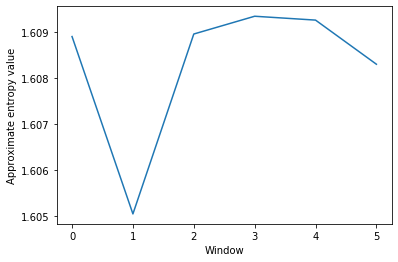

[293. 278. 255. 236. 219. 213. 199. 185. 171. 157. 140. 118.  96.  88.
  79.  72.  71.  79.  89.  97. 101. 102. 104. 101.  95.  91.  87.  83.
  75.  79.]
[1.603903356635802, 1.603692355180089, 1.5875347418452286, 1.601972532235111, 1.608986731591421, 1.607112301620535]


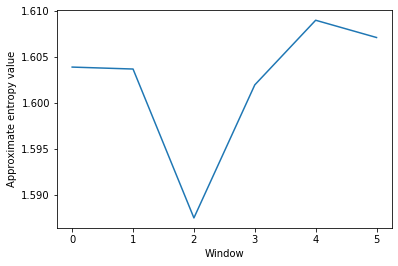

[161. 159. 158. 157. 155. 153. 142. 137. 133. 135. 140. 142. 145. 150.
 153. 157. 154. 151. 150. 150. 153. 155. 156. 155. 155. 158. 158. 160.
 165. 172.]
[1.6093577926813916, 1.6081512491383245, 1.6088855340285382, 1.6092783984696994, 1.6094178445568845, 1.6089009815288149]


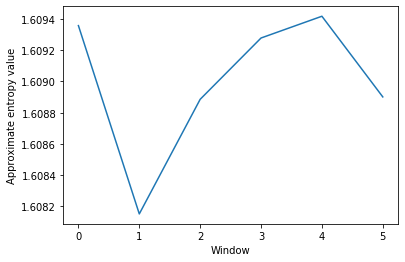

[180. 179. 179. 174. 169. 167. 164. 162. 157. 154. 155. 163. 172. 180.
 184. 178. 169. 154. 140. 128. 117. 107.  99.  90.  81.  79.  76.  74.
  72.  68.]
[1.609156540196616, 1.6090085237115581, 1.607470258863288, 1.6023200091770313, 1.6012862202642844, 1.6081695014256339]


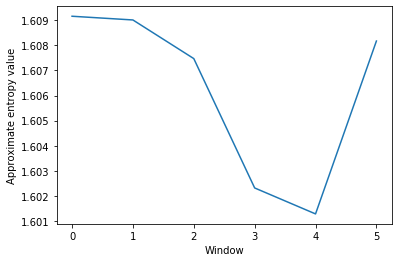

[165. 161. 157. 157. 153. 145. 137. 129. 124. 121. 125. 132. 140. 147.
 144. 137. 126. 117. 112. 108. 103. 100.  94.  88.  85.  86.  90.  96.
 102. 114.]
[1.6091078486102506, 1.6072200118033537, 1.6077049491180682, 1.6057208158825744, 1.6067862896070806, 1.604438327450676]


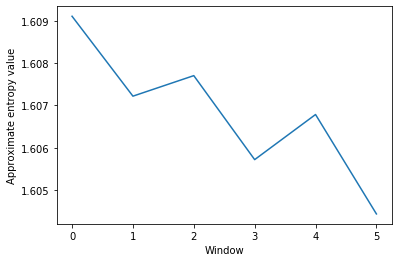

[128. 119. 120. 127. 128. 111. 102.  97.  88.  79.  70.  64.  67.  87.
 127. 124. 107.  99.  92.  85.  76.  73.  69.  74.  75.  68.  62.  57.
  54.  55.]
[1.608910812421204, 1.6026442388244633, 1.5728005537707976, 1.6007903517648292, 1.608890329539212, 1.6056593131294759]


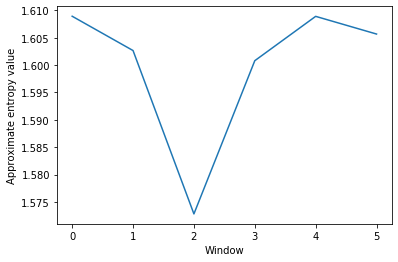

[111. 109. 107. 111. 107. 103. 104. 102. 101. 103. 108. 122. 130. 144.
 159. 152. 150. 149. 147. 139. 133. 125. 118. 111. 112. 107. 109. 101.
  86.  87.]
[1.6093032360776245, 1.6093884684807684, 1.6006224987257425, 1.608966996896818, 1.6070710090771372, 1.6044367167125941]


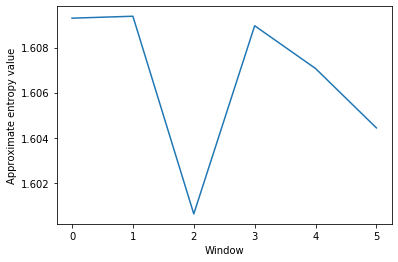

[116. 117. 118. 125. 127. 120. 114. 113. 113. 112. 116. 123. 136. 150.
 161. 161. 168. 160. 155. 153. 149. 151. 156. 156. 156. 157. 155. 147.
 134. 120.]
[1.608745429945008, 1.6091264863713057, 1.6021056172066641, 1.6089001532755547, 1.6092456363537786, 1.604594159340089]


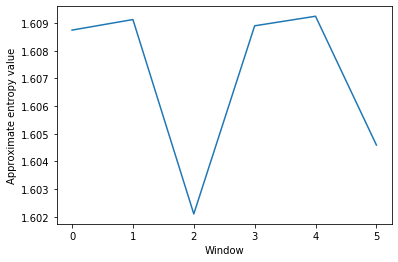

[111. 112. 116. 121. 129. 136. 140. 143. 148. 153. 161. 173. 184. 193.
 199. 202. 199. 194. 190. 189. 187. 187. 191. 198. 205. 214. 222. 228.
 237. 244.]
[1.6078784004955267, 1.6085814838952341, 1.6065868032587147, 1.6091043453157714, 1.60879328018834, 1.608362230562574]


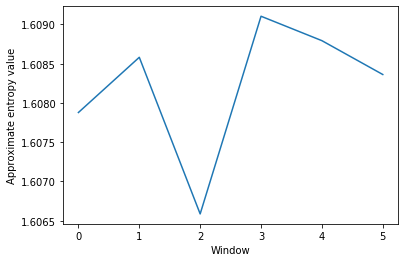

[ 91.  91.  90.  88.  88.  89.  88.  87.  87.  90. 100. 119. 136. 151.
 166. 174. 181. 189. 198. 213. 220. 223. 227. 232. 238. 242. 244. 244.
 239. 233.]
[1.6093231880758003, 1.6093506360911451, 1.594256842062697, 1.6069198494416301, 1.6090427433518752, 1.6092897255232397]


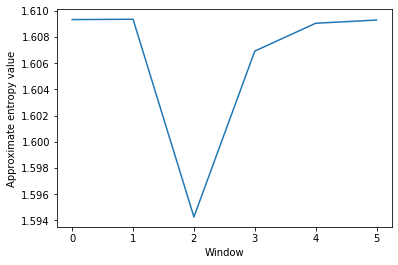

[101.  97.  94.  96.  97.  98. 101. 108. 126. 149. 167. 182. 197. 207.
 215. 214. 213. 202. 186. 170. 167. 159. 153. 146. 137. 126. 114. 108.
  99.  91.]
[1.6091628333190997, 1.5965672217832272, 1.6054125784580466, 1.6057190127507417, 1.6071254396662686, 1.603149645331613]


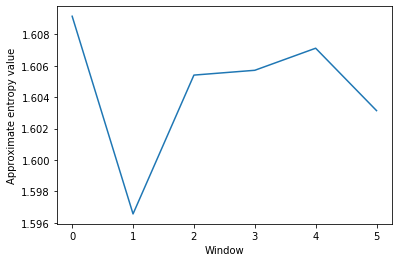

[ 65.  58.  56.  57.  61.  67.  78.  96. 106. 114. 122. 128. 133. 140.
 148. 154. 158. 159. 151. 150. 152. 154. 157. 160. 165. 172. 175. 180.
 184. 189.]
[1.6079483347043213, 1.591171822921276, 1.6071532934917219, 1.6091645582935996, 1.6090159261383037, 1.6088645479297634]


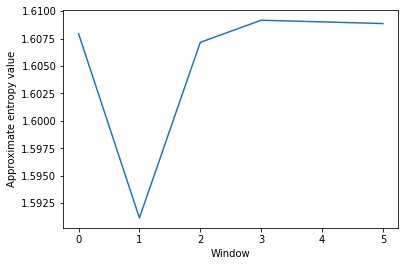

[ 69.  70.  81.  97. 125. 140. 143. 146. 141. 135. 136. 138. 142. 150.
 153. 153. 154. 156. 161. 167. 169. 168. 165. 165. 166. 168. 168. 164.
 153. 139.]
[1.5827474853203467, 1.609104855728019, 1.6083734421735398, 1.6089031393077726, 1.6093904121354807, 1.606911303530496]


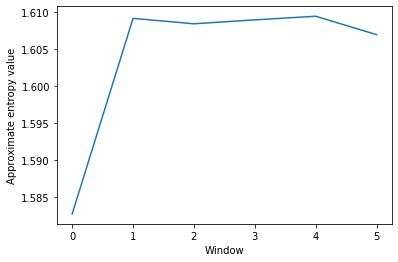

[ 85.  85.  82.  80.  80.  79.  80.  82.  84.  88.  98. 113. 128. 135.
 145. 151. 155. 159. 162. 170. 178. 185. 189. 184. 176. 170. 165. 163.
 165. 171.]
[1.6090671517115567, 1.6086927741440968, 1.6002862129978548, 1.6086184714618033, 1.6090973936220048, 1.6092627889544384]


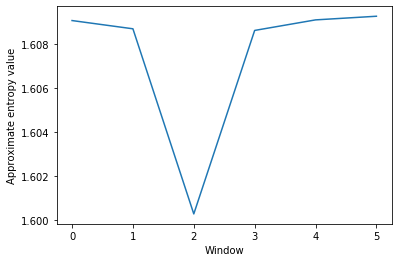

[133. 124. 122. 120. 120. 121. 121. 123. 127. 144. 170. 182. 193. 203.
 213. 222. 226. 231. 236. 241. 235. 229. 227. 220. 211. 196. 183. 171.
 161. 152.]
[1.6086869626463631, 1.6071720494023802, 1.6063196713566041, 1.6090063894580937, 1.6087604969854523, 1.6053661982998255]


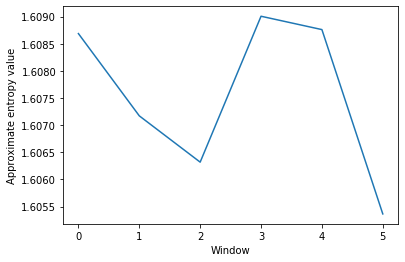

[ 95.  88.  82.  77.  73.  78.  86.  96. 114. 125. 128. 132. 136. 154.
 153. 147. 137. 134. 132. 123. 109. 101. 103.  98.  91.  88.  83.  86.
  88.  86.]
[1.6050219435117379, 1.5942886155505924, 1.6064827883000583, 1.6077779599856525, 1.607691344483869, 1.6092106776887007]


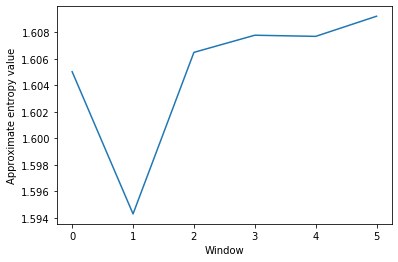

[154. 152. 150. 148. 142. 137. 137. 136. 137. 138. 143. 156. 173. 184.
 201. 215. 219. 233. 253. 270. 278. 293. 298. 304. 311. 324. 344. 343.
 347. 339.]
[1.6090544302959333, 1.609427256470756, 1.6023337983805828, 1.6056520196049924, 1.6087261272705593, 1.6091494351372235]


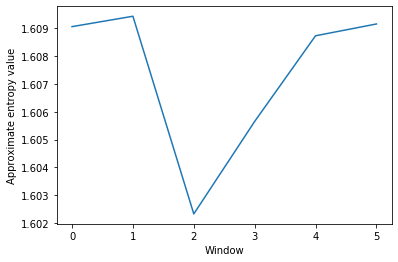

[ 73.  97. 117. 135. 155. 159. 161. 165. 158. 155. 157. 165. 180. 194.
 204. 204. 209. 206. 199. 195. 191. 189. 189. 187. 183. 179. 176. 173.
 170. 165.]
[1.5778286743041665, 1.609221652023925, 1.6047227751065067, 1.6091321141049282, 1.6093331855221726, 1.6090433982532242]


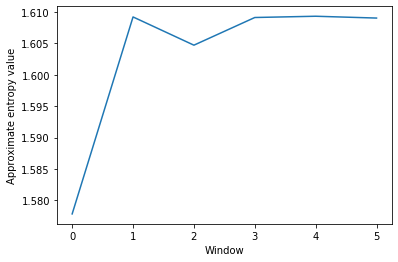

[ 96. 102. 107. 113. 115. 117. 119. 119. 123. 131. 146. 145. 144. 149.
 167. 176. 178. 170. 176. 192. 195. 201. 204. 210. 202. 185. 187. 188.
 181. 164.]
[1.6072655950859194, 1.6086076490201768, 1.6078516693156448, 1.6086088635964901, 1.6091518977626906, 1.6082219217931735]


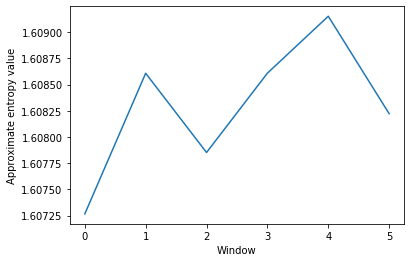

[108. 120. 138. 149. 157. 167. 170. 174. 176. 182. 190. 200. 210. 217.
 223. 231. 238. 233. 223. 219. 212. 211. 210. 204. 191. 175. 159. 149.
 141. 136.]
[1.6002155112961953, 1.6089993701328695, 1.6078147813424815, 1.6089846990284025, 1.6087054252507995, 1.6053216935712584]


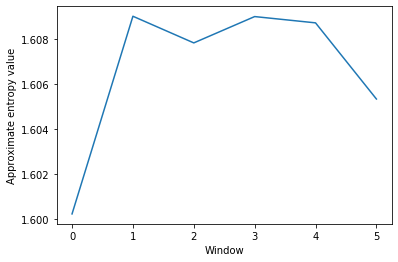

[144. 141. 138. 132. 133. 137. 144. 157. 180. 201. 223. 245. 259. 264.
 279. 294. 306. 321. 324. 333. 338. 333. 333. 326. 322. 322. 323. 320.
 309. 298.]
[1.608882506437916, 1.5991492693265814, 1.6066267582258393, 1.6084670872106746, 1.6092900442800262, 1.60896763058442]


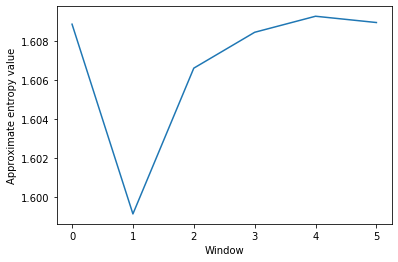

[185. 182. 175. 170. 166. 162. 159. 157. 152. 151. 154. 159. 164. 168.
 169. 166. 163. 160. 156. 152. 143. 133. 123. 110. 101.  92.  86.  81.
  79.  77.]
[1.6086166422799772, 1.6090821147205632, 1.6088358027966052, 1.6089519907906384, 1.6016853435122744, 1.607343108369471]


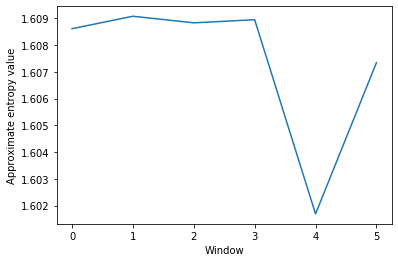

[151. 174. 191. 210. 213. 221. 228. 223. 214. 188. 169. 160. 157. 154.
 153. 150. 146. 139. 130. 119. 107. 100. 105. 114. 120. 122. 123. 125.
 131. 138.]
[1.601666475027151, 1.6072141561681126, 1.6087879285152544, 1.6060443038381655, 1.6073787323317346, 1.6083546606027344]


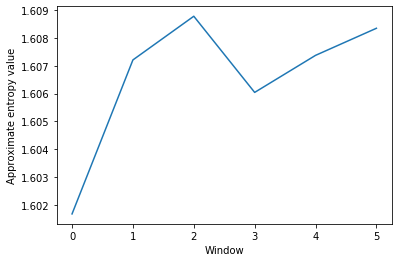

[144. 136. 134. 131. 125. 125. 126. 132. 147. 169. 187. 181. 176. 181.
 191. 197. 195. 194. 189. 187. 183. 171. 162. 159. 155. 153. 150. 150.
 153. 154.]
[1.6083601313482836, 1.6026020093317381, 1.6090309448557267, 1.6092451902315275, 1.6076453372784973, 1.6093772583505597]


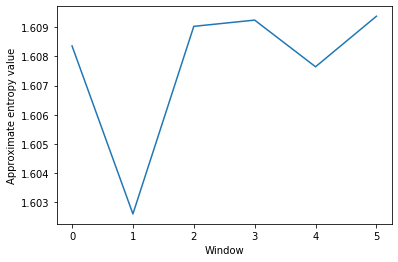

[ 87.  86.  87.  90.  92.  94.  93.  94. 100. 108. 115. 123. 132. 151.
 171. 183. 196. 206. 211. 220. 231. 228. 231. 233. 238. 244. 248. 252.
 252. 255.]
[1.6091168966887053, 1.6077850599079224, 1.5989364646133484, 1.6074582971238753, 1.6093365805977191, 1.6093213400899227]


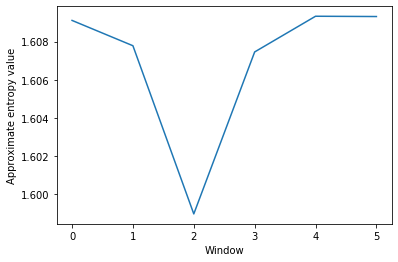

[166. 165. 162. 157. 156. 151. 143. 137. 135. 131. 130. 127. 124. 127.
 129. 130. 128. 123. 121. 121. 121. 124. 124. 126. 128. 128. 128. 130.
 132. 134.]
[1.609118840597149, 1.608196646408713, 1.6093069980880375, 1.608993805968584, 1.6092626049112861, 1.609278284169796]


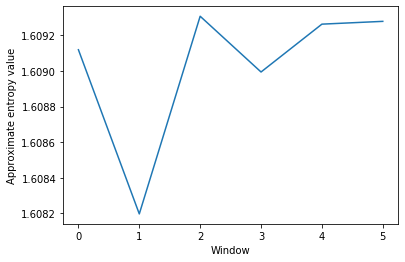

[ 71.  71.  73.  75.  77.  78.  80.  80.  81.  83.  89. 100. 114. 120.
 126. 133. 152. 159. 172. 177. 171. 159. 179. 186. 193. 201. 207. 209.
 211. 211.]
[1.6089348514833, 1.609233924426995, 1.6017180990110353, 1.6045122581384725, 1.6072032932964886, 1.609277641038254]


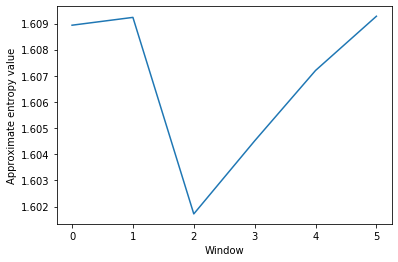

[118. 118. 115. 109. 106. 103. 103. 101.  99. 100. 101. 104. 110. 124.
 141. 152. 166. 179. 185. 191. 194. 189. 185. 183. 184. 187. 190. 188.
 185. 184.]
[1.6085053339018995, 1.6093128994487191, 1.601499267976358, 1.6061716111915934, 1.6092046664928779, 1.6093726040598129]


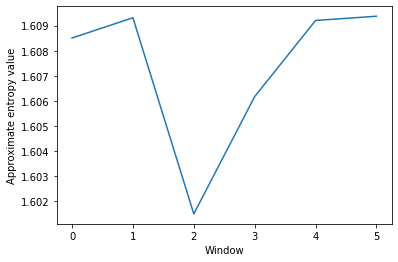

[ 85.  89.  92.  91.  91.  90.  91.  94. 100.  99.  99. 103. 115. 131.
 136. 145. 157. 164. 170. 169. 169. 179. 197. 198. 193. 181. 186. 202.
 206. 205.]
[1.60904552486495, 1.6085181260869095, 1.6015224562662327, 1.6077693639100166, 1.6075747124123791, 1.60801537233927]


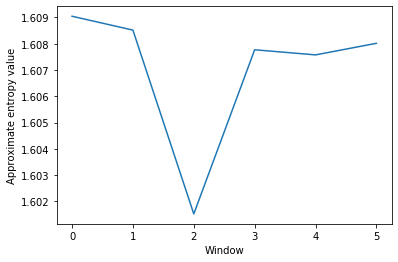

[218. 212. 204. 196. 188. 181. 172. 169. 163. 161. 162. 167. 174. 184.
 192. 197. 198. 197. 194. 191. 186. 180. 173. 170. 172. 176. 180. 182.
 181. 179.]
[1.6080369899553402, 1.608560398628648, 1.6075010684770317, 1.6093506757731029, 1.6088722177302004, 1.6093720112425793]


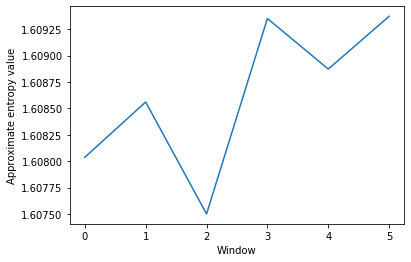

[ 95.  93.  92.  89.  89.  91.  96.  95.  92.  91.  92.  93.  97. 101.
  99.  96.  91.  87.  84.  79.  76.  71.  65.  60.  56.  55.  56.  53.
  50.  52.]
[1.6091139865898687, 1.6091842650335022, 1.6088003293392221, 1.6072223501422092, 1.6033747483554688, 1.6086304631995252]


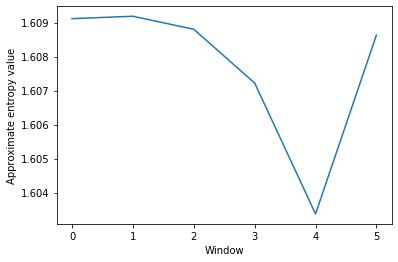

[181. 182. 181. 178. 173. 170. 163. 161. 162. 161. 159. 158. 159. 163.
 170. 177. 181. 183. 182. 185. 187. 183. 176. 167. 159. 154. 149. 144.
 142. 140.]
[1.6092683437873554, 1.6092255956400638, 1.609063974469689, 1.6093308587971864, 1.6076940164833862, 1.6088353275625704]


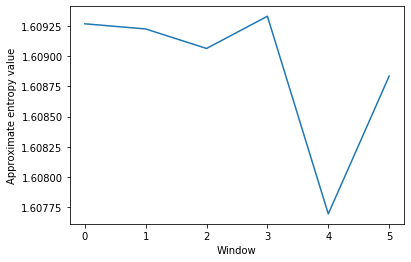

[146. 145. 141. 128. 107.  98.  90.  83.  76.  85.  89.  94.  96.  97.
  99.  98.  93.  88.  90.  91.  96. 112. 106. 100.  99.  96.  93.  96.
  94.  89.]
[1.6031488719533193, 1.6058456244709725, 1.6087893242481028, 1.6087584658531227, 1.6079021069563924, 1.6090560051812832]


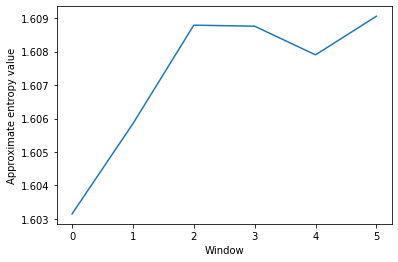

[123. 115. 122. 123. 120. 115. 111.  97.  92.  88.  93. 108. 122. 137.
 158. 177. 191. 208. 220. 232. 238. 250. 252. 256. 251. 256. 256. 244.
 213. 215.]
[1.6091242899698202, 1.603925755020485, 1.5927993071229989, 1.604814241322064, 1.609140778590143, 1.6061451111461196]


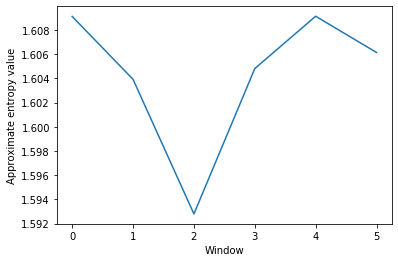

[176. 176. 170. 158. 144. 146. 130. 125. 120. 108. 111. 114. 121. 123.
 127. 134. 133. 129. 132. 134. 135. 136. 143. 147. 153. 161. 161. 158.
 153. 142.]
[1.606598647738138, 1.6045534440538718, 1.6082179033557935, 1.6093393408548418, 1.608319189362029, 1.6083641069073087]


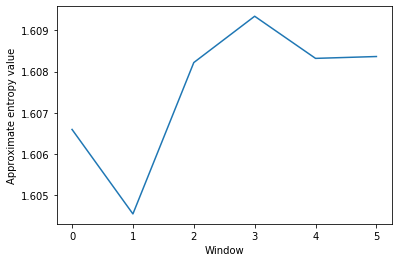

[156. 161. 169. 164. 161. 161. 166. 166. 163. 160. 155. 144. 137. 140.
 142. 148. 155. 155. 151. 147. 141. 135. 129. 125. 119. 111. 102.  96.
  93.  93.]
[1.6090933073323144, 1.60932226958937, 1.6085325545014806, 1.609189460336169, 1.6077008944572102, 1.607091072855392]


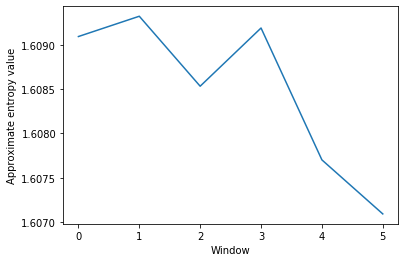

[ 90.  99. 105. 113. 118. 121. 121. 118. 115. 112. 110. 109. 110. 113.
 115. 116. 116. 116. 119. 124. 130. 137. 140. 137. 131. 121. 104.  93.
  84.  79.]
[1.6049198217134695, 1.6089921689453295, 1.6092355847862134, 1.6090918273548098, 1.6090311490343292, 1.5974596737671036]


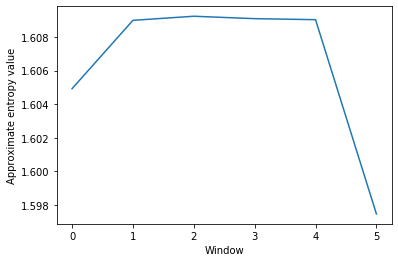

[139. 135. 135. 137. 141. 145. 150. 143. 150. 150. 149. 152. 158. 169.
 180. 188. 191. 194. 190. 182. 177. 170. 160. 154. 152. 148. 144. 142.
 136. 129.]
[1.6092941200748718, 1.6092296550591918, 1.6069469966955936, 1.609212877350154, 1.6077266970732011, 1.6082990420075287]


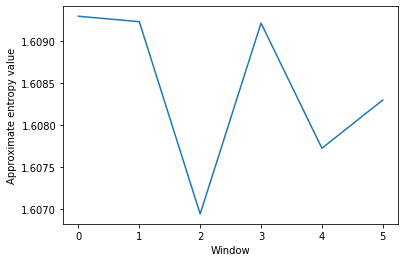

[ 90. 100. 106. 107. 109. 108. 109. 115. 122. 127. 133. 147. 161. 176.
 189. 195. 204. 205. 205. 202. 202. 203. 202. 199. 193. 185. 175. 165.
 156. 147.]
[1.607125333330889, 1.6074416107385472, 1.601746898777778, 1.609263409934476, 1.6092694632587772, 1.6061441886158119]


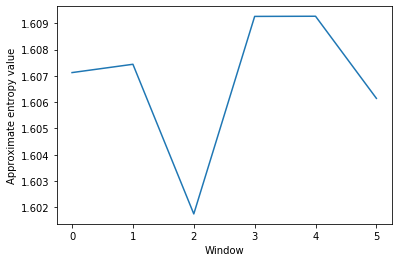

[265. 267. 266. 267. 264. 262. 221. 202. 200. 196. 188. 178. 173. 166.
 159. 154. 153. 158. 162. 165. 169. 173. 178. 182. 186. 187. 189. 194.
 197. 198.]
[1.6094282823109567, 1.603269719198262, 1.607783708812921, 1.6090193116828042, 1.608850235130978, 1.6091851099449266]


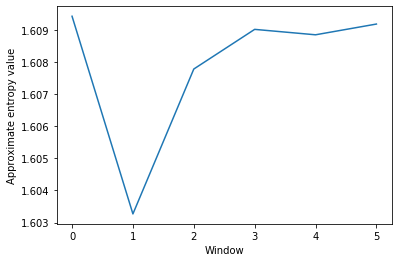

[152. 146. 138. 133. 129. 122. 120. 118. 116. 118. 123. 130. 148. 161.
 171. 180. 186. 190. 190. 181. 171. 143. 131. 128. 126. 129. 131. 134.
 135. 133.]
[1.6076322134989136, 1.6092907501142646, 1.6017894376143795, 1.6091723093080423, 1.6025928113524517, 1.6093052661513436]


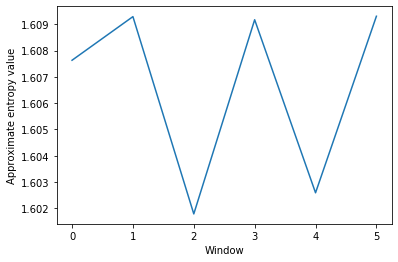

[102.  96.  95.  90.  85.  81.  79.  79.  78.  76.  79.  83.  89. 101.
 111. 117. 124. 130. 134. 139. 143. 162. 162. 157. 150. 139. 129. 123.
 117. 111.]
[1.6075469600856809, 1.60922395140665, 1.6013905265596486, 1.6076503519363783, 1.6082981264365206, 1.6063951671989165]


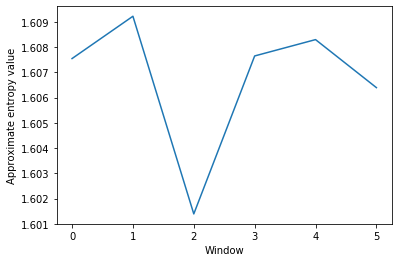

[ 40.  40.  43.  50.  61.  81. 102. 127. 137. 157. 180. 201. 218. 239.
 253. 262. 271. 272. 272. 266. 230. 212. 192. 179. 183. 178. 176. 168.
 155. 135.]
[1.5954646312127554, 1.5844064053158717, 1.6022388282456947, 1.6093277619403925, 1.6048801211110935, 1.604510695050687]


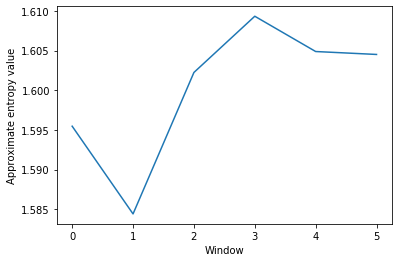

[ 91. 111. 124. 128. 130. 129. 126. 125. 125. 125. 128. 137. 155. 173.
 190. 203. 210. 219. 230. 243. 247. 253. 260. 263. 261. 262. 263. 262.
 257. 244.]
[1.6014072603716112, 1.609362721088904, 1.5989153609955855, 1.6073723100513524, 1.609168489987301, 1.6090519383233208]


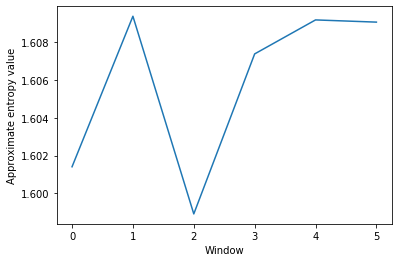

[205. 193. 184. 163. 155. 148. 142. 136. 131. 132. 133. 137. 140. 144.
 145. 148. 154. 161. 171. 183. 191. 196. 200. 197. 190. 181. 165. 153.
 143. 132.]
[1.6040874217286936, 1.6083666320044816, 1.608930759619824, 1.6065636307434528, 1.6092512630392792, 1.6034031349148945]


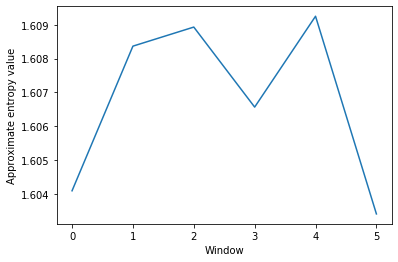

[130. 130. 127. 122. 117. 115. 114. 114. 116. 121. 134. 155. 170. 183.
 197. 209. 217. 225. 231. 236. 241. 244. 247. 251. 255. 258. 257. 252.
 249. 247.]
[1.6086225197782338, 1.6091874842624259, 1.6007991913947228, 1.6084997199122735, 1.6092371714776788, 1.6092918783698498]


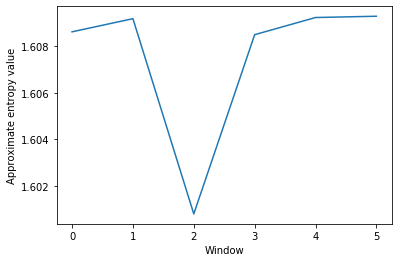

[186. 184. 181. 177. 176. 174. 176. 176. 173. 174. 178. 185. 197. 211.
 226. 238. 248. 257. 264. 270. 271. 269. 269. 267. 265. 263. 261. 259.
 256. 251.]
[1.609209106894272, 1.6094143001371952, 1.605656075727283, 1.6084412950607407, 1.609408975478991, 1.6093053126557169]


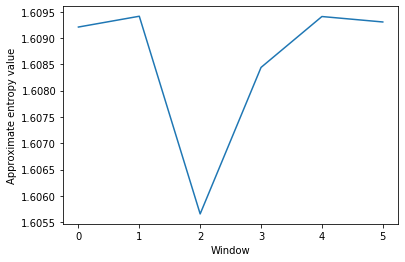

[147. 147. 147. 145. 142. 139. 138. 139. 144. 164. 180. 194. 207. 219.
 223. 228. 220. 209. 202. 194. 186. 175. 169. 167. 166. 170. 170. 170.
 170. 171.]
[1.6093469196255525, 1.6072002718551375, 1.6063740229507708, 1.6077638682658781, 1.608532594779773, 1.6094351540068255]


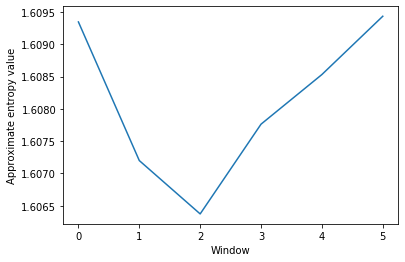

[199. 203. 203. 201. 199. 197. 182. 180. 177. 179. 182. 190. 202. 214.
 230. 233. 250. 266. 276. 285. 292. 296. 298. 297. 301. 307. 306. 299.
 296. 289.]
[1.609398308800452, 1.6086801891217932, 1.6059380518250814, 1.606899009632754, 1.6093892790947892, 1.6091905691257553]


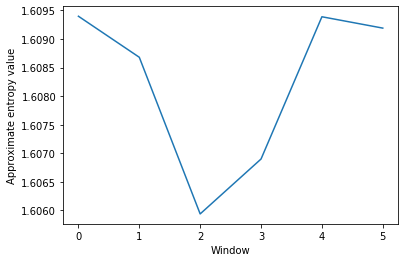

[126. 129. 129. 129. 130. 129. 122. 122. 122. 124. 129. 142. 154. 160.
 166. 174. 178. 186. 192. 194. 192. 190. 189. 188. 189. 190. 187. 178.
 167. 159.]
[1.6093820503292537, 1.6091999145746572, 1.6054912357610294, 1.6085545287698289, 1.6094123652883536, 1.6071982708386696]


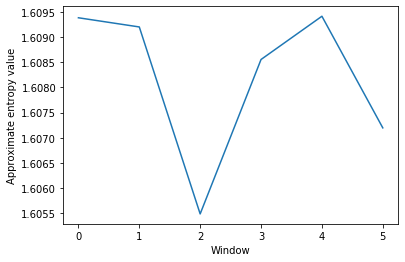

[115. 115. 116. 116. 115. 114. 118. 124. 136. 151. 164. 178. 205. 226.
 244. 264. 282. 296. 298. 309. 304. 297. 291. 276. 277. 282. 281. 278.
 273. 269.]
[1.6094289066779472, 1.6040721849559676, 1.5988478251089224, 1.6079932837595288, 1.6087120570512914, 1.6092791047003936]


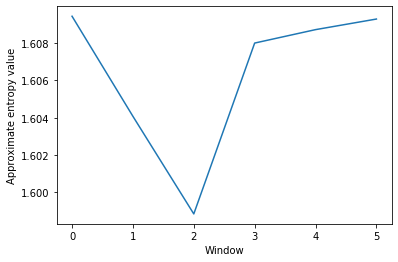

[ 91.  90.  90.  91.  92.  92.  92.  95.  97. 101. 108. 120. 133. 142.
 152. 163. 167. 168. 173. 172. 175. 183. 203. 217. 222. 226. 226. 221.
 220. 219.]
[1.609403982327634, 1.6088130527439595, 1.602279667597439, 1.6092081278655832, 1.6051688493361334, 1.6093466387189541]


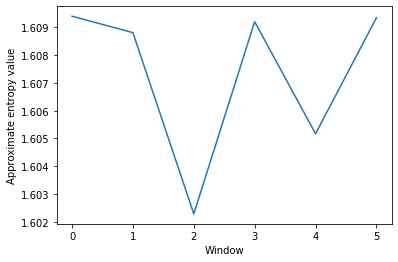

[192. 190. 185. 178. 172. 166. 161. 159. 163. 170. 178. 191. 202. 212.
 223. 227. 225. 218. 209. 198. 181. 168. 156. 145. 136. 126. 117. 112.
 110. 113.]
[1.6086036175746528, 1.609159955876576, 1.6063741629360129, 1.6081826819006246, 1.6042609839802546, 1.6082496334060545]


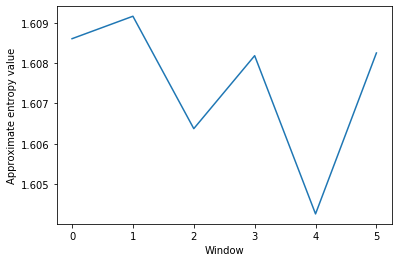

[138. 138. 135. 134. 132. 128. 126. 123. 121. 124. 126. 127. 129. 131.
 135. 140. 148. 154. 157. 164. 170. 178. 189. 197. 202. 207. 210. 206.
 202. 197.]
[1.609289442532069, 1.609249353316937, 1.609134485168136, 1.6080093523107435, 1.6074332098822555, 1.6091947826387176]


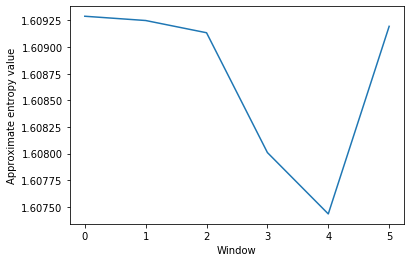

[113. 108. 101.  96.  97.  99. 113. 120. 122. 124. 126. 129. 134. 139.
 146. 146. 150. 157. 157. 166. 191. 194. 196. 205. 206. 208. 214. 217.
 221. 220.]
[1.6074357170897209, 1.6062586793918474, 1.6080427264812278, 1.6084656430821742, 1.608978432568743, 1.609201013874031]


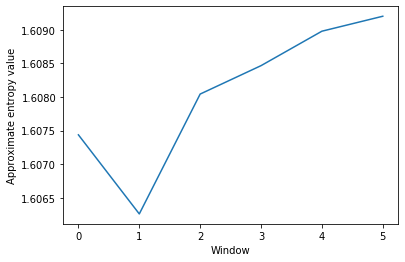

[116.  88.  76.  72.  79.  92. 116. 135. 144. 153. 163. 173. 181. 190.
 199. 202. 208. 212. 215. 222. 231. 237. 242. 248. 254. 257. 261. 261.
 258. 254.]
[1.5935693972540208, 1.5943693897005542, 1.6070184174454087, 1.6089369645754594, 1.6088845039385813, 1.6093856494268104]


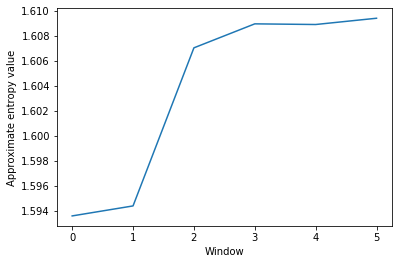

[182. 176. 168. 170. 176. 179. 163. 152. 143. 143. 152. 163. 180. 193.
 205. 216. 229. 224. 210. 184. 179. 175. 173. 181. 185. 193. 211. 206.
 200. 192.]
[1.6090333847579497, 1.60566988711958, 1.6035903801571365, 1.60663781828555, 1.6091522686381672, 1.608768902271868]


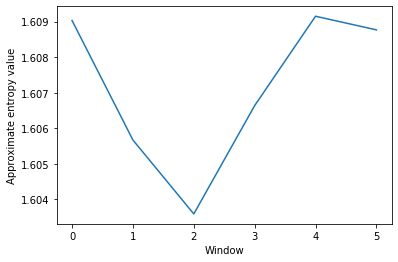

[160. 167. 178. 201. 212. 214. 221. 226. 232. 243. 251. 261. 277. 288.
 290. 297. 298. 293. 290. 290. 296. 301. 303. 308. 309. 312. 316. 323.
 322. 324.]
[1.6036235062922306, 1.6084985860381624, 1.6078797261235864, 1.6093715947509497, 1.6093147545918174, 1.6093325356458485]


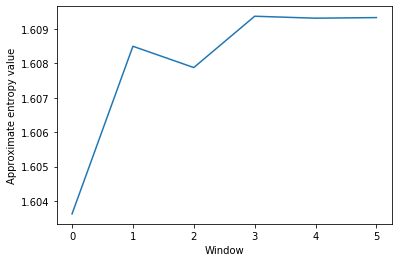

[195. 199. 202. 211. 216. 213. 217. 220. 220. 225. 232. 241. 253. 263.
 268. 269. 271. 283. 287. 294. 302. 310. 318. 328. 335. 334. 338. 340.
 344. 354.]
[1.6087207179180216, 1.609275242336975, 1.6080124901450956, 1.608863432787385, 1.6087409747554644, 1.6092404906073758]


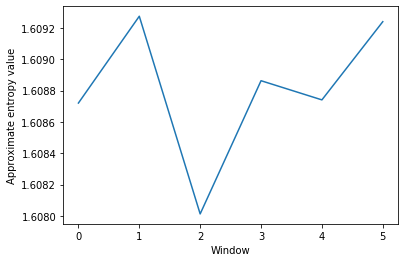

[183. 176. 170. 164. 159. 152. 152. 155. 147. 149. 158. 169. 181. 179.
 169. 153. 136. 124. 112. 101.  90.  85.  83.  87.  91.  93.  95. 100.
 102. 102.]
[1.6081959802196626, 1.6092711779879667, 1.6082682701056799, 1.5989477730902135, 1.6088481630864184, 1.6087195090246158]


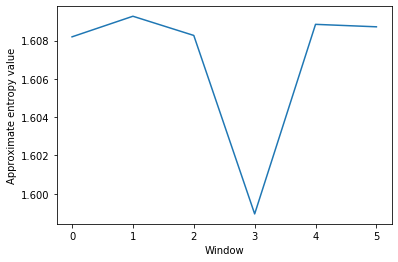

[144. 141. 137. 136. 130. 132. 144. 142. 134. 130. 132. 140. 163. 178.
 190. 203. 223. 244. 247. 262. 278. 287. 309. 316. 329. 320. 307. 286.
 254. 265.]
[1.6088379810437397, 1.6086067504352923, 1.6000195690642094, 1.6055734315932249, 1.6075256990502274, 1.6057030858119237]


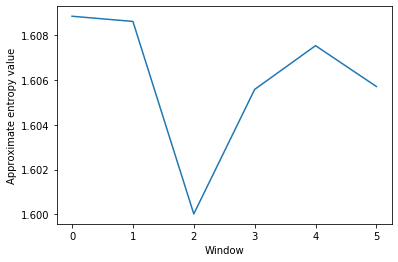

[113. 111. 107. 102. 102. 104. 111. 114. 118. 125. 143. 148. 153. 155.
 154. 158. 168. 176. 182. 187. 190. 190. 188. 185. 187. 197. 205. 208.
 202. 195.]
[1.608547466414551, 1.6075635860946924, 1.60898847546061, 1.607681385251461, 1.6093869226849933, 1.6091488771697982]


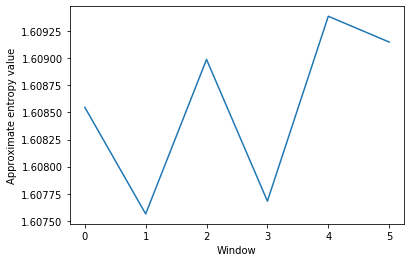

[ 77.  73.  75.  82. 102. 116. 128. 133. 142. 152. 171. 191. 214. 228.
 235. 251. 262. 270. 274. 278. 280. 282. 284. 290. 310. 313. 320. 312.
 312. 309.]
[1.6015235412935258, 1.605266824972344, 1.6027791890212415, 1.6087879585546685, 1.6087345172328034, 1.6093700674526672]


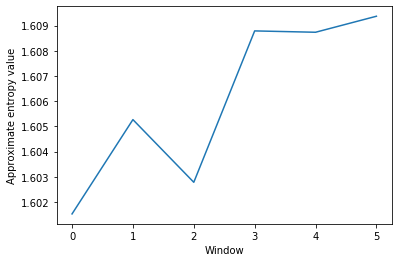

[144. 136. 121. 124. 123. 115. 111. 109. 115. 133. 159. 180. 202. 219.
 219. 235. 262. 254. 238. 229. 222. 222. 223. 232. 240. 233. 227. 220.
 215. 213.]
[1.6071030027379463, 1.6068396819153525, 1.6021889521853363, 1.6081554985327942, 1.6089468111947147, 1.608871360817914]


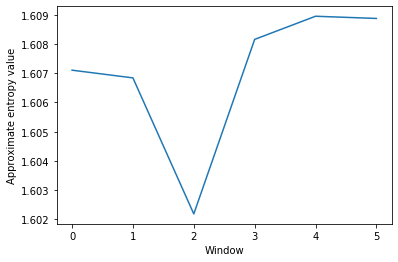

[268. 263. 243. 235. 225. 226. 225. 219. 208. 200. 202. 212. 216. 212.
 208. 200. 193. 198. 204. 215. 224. 225. 222. 220. 218. 215. 206. 196.
 190. 182.]
[1.6072381345372238, 1.6083343627409032, 1.6091828603195402, 1.6087717418774479, 1.6093711841288068, 1.6077115906866637]


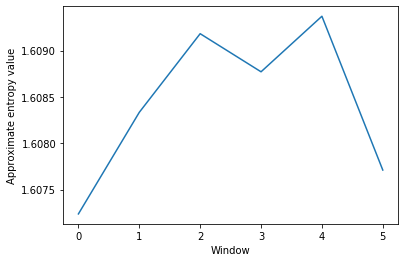

[178. 166. 156. 152. 159. 151. 147. 147. 148. 151. 153. 154. 157. 155.
 149. 141. 135. 129. 135. 137. 136. 139. 139. 141. 139. 139. 141. 140.
 140. 140.]
[1.6078727529171934, 1.6093621265694564, 1.6092881877143617, 1.609026484547716, 1.6093713277706039, 1.6094277082656967]


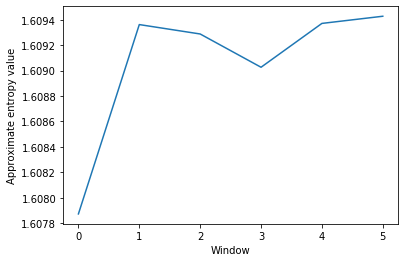

[166. 161. 160. 154. 146. 140. 137. 138. 147. 158. 181. 200. 211. 212.
 219. 225. 224. 225. 226. 227. 229. 230. 229. 227. 226. 225. 224. 221.
 218. 213.]
[1.6084809121934984, 1.6079846286348443, 1.607291929986375, 1.6094276813766593, 1.6094171575009961, 1.6092416951867348]


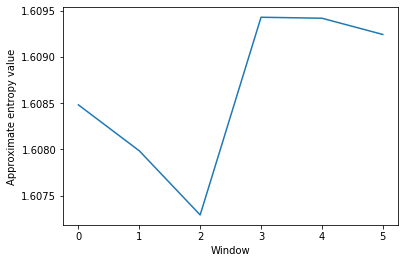

[ 78.  74.  71.  72.  74.  77.  82.  98. 112. 123. 135. 150. 167. 173.
 185. 198. 210. 222. 237. 253. 269. 287. 300. 312. 320. 327. 331. 325.
 319. 320.]
[1.608912757549756, 1.5937605092484537, 1.60345692746299, 1.6056896550026032, 1.6075650885897228, 1.609343703952333]


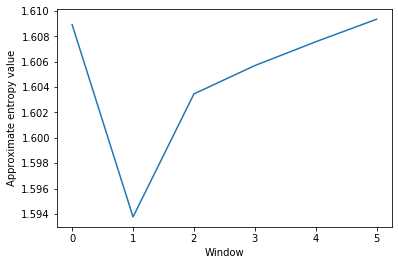

[168. 162. 157. 151. 147. 149. 148. 151. 156. 166. 178. 183. 188. 195.
 201. 208. 213. 219. 226. 234. 243. 249. 250. 255. 269. 272. 276. 275.
 269. 267.]
[1.6082951930657132, 1.608530538925483, 1.6084931524950057, 1.608560084665522, 1.6088431188610564, 1.609358273066145]


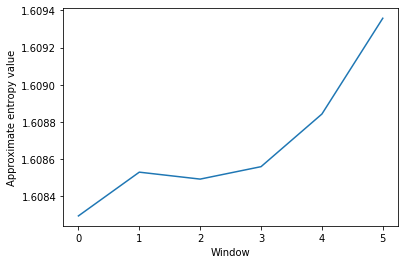

[133. 137. 141. 142. 140. 138. 136. 138. 146. 168. 171. 168. 165. 162.
 161. 162. 162. 164. 169. 179. 190. 196. 202. 209. 222. 233. 247. 250.
 256. 252.]
[1.6091593689158057, 1.6061786692701734, 1.6091854338804714, 1.6087072627904964, 1.607973147814473, 1.608928007256555]


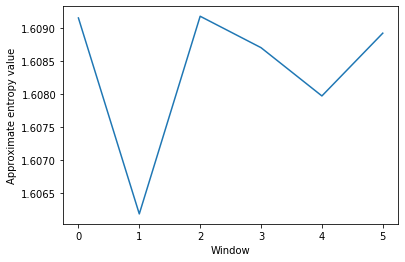

(186,)

In [14]:
# Windowed Entropy 
output_entropy = []

y = []
ordered_cgm = []
df_list = [CGMSeriesLunchPat1, CGMSeriesLunchPat2, CGMSeriesLunchPat3, CGMSeriesLunchPat4, CGMSeriesLunchPat5]
for df in df_list:
    for j in range(len(df)):
        for i in range(1):
            temp = []
            temp1 = []
            c = df.iloc[j]
            if df.isnull().iloc[j,i] == False:
                y.append(c[i])
            for m in range(len(c)-1,-1,-1):
                temp.append(c[m])
            y_array = np.array(temp)
            ordered_cgm.append(y_array)
        
for i in range(len(ordered_cgm)):
    entropy_arr = []
    print(np.asarray(ordered_cgm)[i][1:])
    for j in range(1, 30, 5):
        s = scipy.stats.entropy(np.asarray(ordered_cgm)[i, j:j+5])
        entropy_arr.append(s)
    output_entropy.append(np.amin(np.asarray(entropy_arr)))
    print(entropy_arr)    
    plt.plot(entropy_arr)
    plt.xlabel('Window')
    plt.ylabel('Approximate entropy value')
    plt.show()

output_entropy = np.asarray(output_entropy)
output_entropy.shape

In [15]:
# Area Under Curve
CGMDatenumLunchPat1Mapped = CGMDatenumLunchPat1[CGMDatenumLunchPat1.index.isin(CGMSeriesLunchPat1.index)]
CGMDatenumLunchPat2Mapped = CGMDatenumLunchPat2[CGMDatenumLunchPat2.index.isin(CGMSeriesLunchPat2.index)]
CGMDatenumLunchPat3Mapped = CGMDatenumLunchPat3[CGMDatenumLunchPat3.index.isin(CGMSeriesLunchPat3.index)]
CGMDatenumLunchPat4Mapped = CGMDatenumLunchPat4[CGMDatenumLunchPat4.index.isin(CGMSeriesLunchPat4.index)]
CGMDatenumLunchPat5Mapped = CGMDatenumLunchPat5[CGMDatenumLunchPat5.index.isin(CGMSeriesLunchPat5.index)]

print(CGMSeriesLunchPat1.shape == CGMDatenumLunchPat1Mapped.shape)
print(CGMSeriesLunchPat2.shape == CGMDatenumLunchPat2Mapped.shape)
print(CGMSeriesLunchPat3.shape == CGMDatenumLunchPat3Mapped.shape)
print(CGMSeriesLunchPat4.shape == CGMDatenumLunchPat4Mapped.shape)
print(CGMSeriesLunchPat5.shape == CGMDatenumLunchPat5Mapped.shape)

df_list = [CGMSeriesLunchPat1Scaled, CGMSeriesLunchPat2Scaled, CGMSeriesLunchPat3Scaled, 
           CGMSeriesLunchPat4Scaled, CGMSeriesLunchPat5Scaled]
df_datenum_list = [CGMDatenumLunchPat1Mapped, CGMDatenumLunchPat2Mapped, CGMDatenumLunchPat3Mapped, 
                   CGMDatenumLunchPat4Mapped, CGMDatenumLunchPat5Mapped]
feature_auc = []

for df, df_datenum in zip(df_list, df_datenum_list):
    for x in simps(df[:,::-1], df_datenum[df_datenum.columns[::-1]]):
        feature_auc.append(x)


feature_auc = np.asarray(feature_auc)
feature_auc.shape

True
True
True
True
True


(186,)

In [16]:
# Feature Matrix
feature_matrix = np.hstack((top_fft_features[:,1:9], top_dwt_features[:,1:7], feature_cov_[:,None], output_entropy[:, None], feature_auc[:, None]))
feature_matrix

array([[2.69786569, 1.4382439 , 0.89542982, ..., 1.30529426, 1.59535165,
        0.04384611],
       [0.18643809, 0.72389598, 0.1721746 , ..., 2.61109131, 1.60634042,
        0.13540193],
       [1.04949281, 0.63915624, 0.57948447, ..., 2.14153573, 1.59852747,
        0.06437328],
       ...,
       [2.58227205, 1.6459512 , 1.39467019, ..., 1.03811036, 1.59376051,
        0.04551613],
       [1.62827461, 2.4072073 , 1.07205214, ..., 3.62141934, 1.60829519,
        0.07135031],
       [4.55421705, 1.64257455, 1.35734672, ..., 2.11064544, 1.60617867,
        0.05302614]])

In [17]:
feature_matrix.shape

(186, 17)

In [18]:
scaled_feature_matrix = scaler.fit_transform(feature_matrix)
new_scaled_feature_matrix = np.nan_to_num(scaled_feature_matrix)
scaled_feature_matrix_ = np.asmatrix(new_scaled_feature_matrix)
scaled_feature_matrix_

matrix([[0.32227594, 0.43266876, 0.40978043, ..., 0.09033469, 0.75956188,
         0.28113232],
        [0.01957835, 0.21412369, 0.0696775 , ..., 0.24877019, 0.94857486,
         1.        ],
        [0.1236007 , 0.18819872, 0.26121055, ..., 0.19179788, 0.81418776,
         0.44230529],
        ...,
        [0.30834366, 0.496214  , 0.6445428 , ..., 0.05791662, 0.73219339,
         0.29424484],
        [0.19336017, 0.72910999, 0.49283516, ..., 0.37135573, 0.98219799,
         0.49708669],
        [0.54601844, 0.49518096, 0.62699184, ..., 0.18804989, 0.94579261,
         0.35321102]])

In [19]:
pca = PCA(n_components=5)
reduced_matrix = pca.fit_transform(new_scaled_feature_matrix)
reduced_matrix

array([[ 6.18315759e-01,  2.15453676e-01, -1.73097074e-01,
        -2.71230942e-01,  3.06835318e-02],
       [ 1.97812644e-01,  1.49240873e+00,  3.48594616e-01,
        -1.93254433e-01, -1.92940564e-01],
       [ 1.96646975e-01,  6.94101464e-01, -4.33562618e-02,
        -2.19958596e-01, -5.15888011e-02],
       [ 7.41547737e-01, -1.53145781e-01, -7.34471239e-02,
        -2.23047805e-01,  2.73856064e-02],
       [-1.64838640e-02, -3.16419500e-01,  2.11664813e-01,
        -5.69058503e-02, -1.58915403e-01],
       [ 1.20549200e+00, -2.58056502e-01, -1.66152862e-01,
        -3.15704343e-02, -3.15371867e-01],
       [ 8.96791314e-01, -5.43366135e-01, -1.36130456e-01,
        -2.84791961e-02, -3.89376734e-01],
       [-3.36334754e-01,  3.62190596e-01, -2.40590283e-01,
        -2.94817662e-01,  5.47141343e-02],
       [-6.06860702e-02, -1.09699540e-01, -2.13516916e-02,
        -2.15917615e-01,  1.52050824e-01],
       [-3.14934412e-01, -8.65585650e-02,  3.65758653e-01,
         4.16728209e-02

In [20]:
pca.components_

array([[ 0.27509516,  0.28141957,  0.30451533,  0.36192117,  0.36061662,
         0.36465237,  0.2882157 ,  0.32251244,  0.18182996,  0.1737597 ,
         0.1762222 ,  0.18408396,  0.16105229,  0.12553753, -0.02793018,
         0.00872536,  0.02369432],
       [-0.11907799, -0.12523948, -0.12483264, -0.14095503, -0.14775233,
        -0.20052178, -0.13407325, -0.14277605,  0.36656786,  0.36428838,
         0.36463968,  0.37304756,  0.37394615,  0.34685779,  0.09221606,
         0.03012814,  0.15975442],
       [ 0.30665766,  0.02659537,  0.16969256,  0.10402426, -0.16360993,
        -0.00079866, -0.07028466, -0.13775404, -0.27278353, -0.24229204,
        -0.14450234,  0.02425468,  0.13084124,  0.18834608,  0.23740522,
        -0.01895599,  0.74232907],
       [-0.11740835,  0.05396929, -0.10087943,  0.03567301,  0.03336525,
        -0.06581973,  0.10272943,  0.09892551, -0.37016612, -0.28145166,
        -0.16181075,  0.08551625,  0.35880662,  0.57165394,  0.11909429,
        -0.23405689

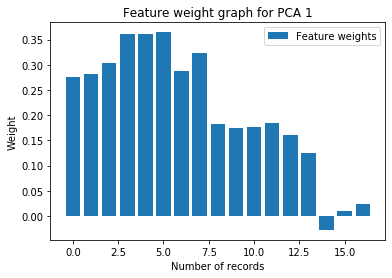

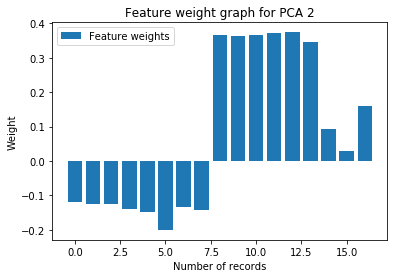

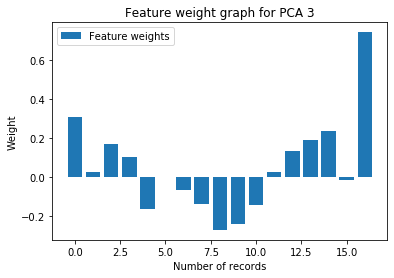

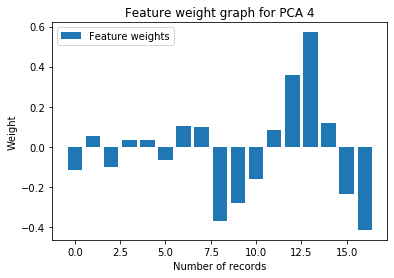

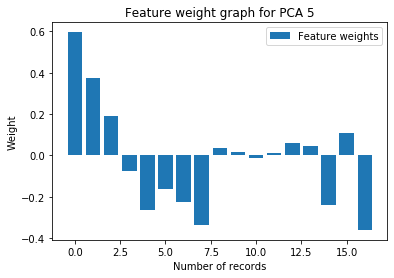

In [21]:
# Choosing the top 5 features from PCA based on their weights
x_axis = np.arange(len(pca.components_[0]))
width = 0.30

for i in range(0,5):
    plt.title("Feature weight graph for PCA "+str(i+1))
    plt.bar(x_axis, pca.components_[i], label = 'Feature weights')
    plt.xlabel('Number of records')
    plt.ylabel('Weight')
    plt.legend()
    plt.show()

In [22]:
PCA_variance = pca.explained_variance_ratio_
PCA_variance

array([0.43449218, 0.34290703, 0.04928412, 0.03510119, 0.02675224])

In [23]:
PCA_var_sum = np.sum(np.asarray(PCA_variance))
PCA_var_sum

0.8885367662095708

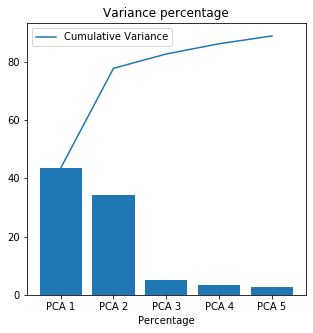

In [24]:
objects = ('PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5')
y_pos = np.arange(len(objects))
PCA_var_percent = PCA_variance * 100
plt.figure(figsize=(5,5))
plt.xlabel("Percentage")
plt.plot(np.cumsum(PCA_var_percent), label='Cumulative Variance')
plt.bar(y_pos, PCA_var_percent)
plt.xticks(y_pos, objects)
plt.title('Variance percentage')
plt.legend()
plt.show()

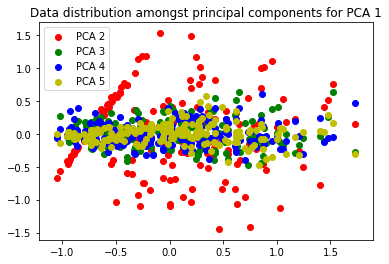

In [25]:
plt.title("Data distribution amongst principal components for PCA 1")
plt.scatter(reduced_matrix[:,0], reduced_matrix[:,1], c='r', label='PCA 2')
plt.scatter(reduced_matrix[:,0], reduced_matrix[:,2], c='g', label='PCA 3')
plt.scatter(reduced_matrix[:,0], reduced_matrix[:,3], c='b', label='PCA 4')
plt.scatter(reduced_matrix[:,0], reduced_matrix[:,4], c='y', label='PCA 5')
plt.legend()
plt.show()

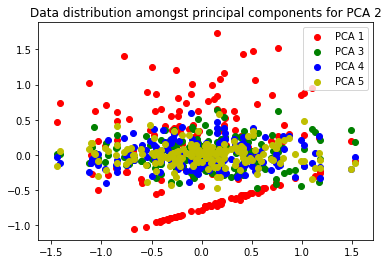

In [26]:
plt.title("Data distribution amongst principal components for PCA 2")
plt.scatter(reduced_matrix[:,1], reduced_matrix[:,0], c='r', label='PCA 1')
plt.scatter(reduced_matrix[:,1], reduced_matrix[:,2], c='g', label='PCA 3')
plt.scatter(reduced_matrix[:,1], reduced_matrix[:,3], c='b', label='PCA 4')
plt.scatter(reduced_matrix[:,1], reduced_matrix[:,4], c='y', label='PCA 5')
plt.legend()
plt.show()

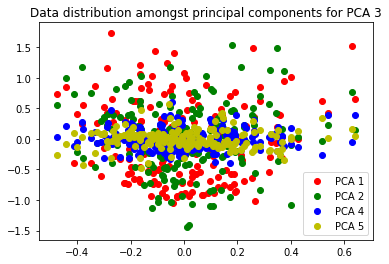

In [27]:
plt.title("Data distribution amongst principal components for PCA 3")
plt.scatter(reduced_matrix[:,2], reduced_matrix[:,0], c='r', label='PCA 1')
plt.scatter(reduced_matrix[:,2], reduced_matrix[:,1], c='g', label='PCA 2')
plt.scatter(reduced_matrix[:,2], reduced_matrix[:,3], c='b', label='PCA 4')
plt.scatter(reduced_matrix[:,2], reduced_matrix[:,4], c='y', label='PCA 5')
plt.legend()
plt.show()

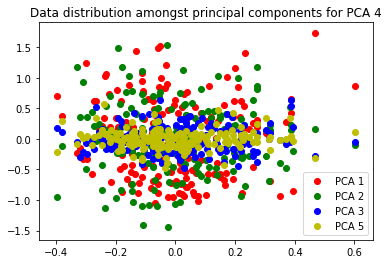

In [28]:
plt.title("Data distribution amongst principal components for PCA 4")
plt.scatter(reduced_matrix[:,3], reduced_matrix[:,0], c='r', label='PCA 1')
plt.scatter(reduced_matrix[:,3], reduced_matrix[:,1], c='g', label='PCA 2')
plt.scatter(reduced_matrix[:,3], reduced_matrix[:,2], c='b', label='PCA 3')
plt.scatter(reduced_matrix[:,3], reduced_matrix[:,4], c='y', label='PCA 5')
plt.legend()
plt.show()

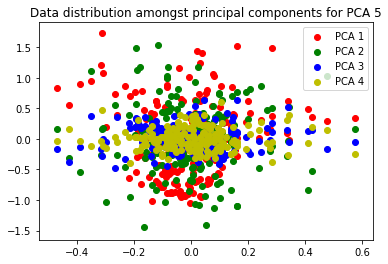

In [29]:
plt.title("Data distribution amongst principal components for PCA 5")
plt.scatter(reduced_matrix[:,4], reduced_matrix[:,0], c='r', label='PCA 1')
plt.scatter(reduced_matrix[:,4], reduced_matrix[:,1], c='g', label='PCA 2')
plt.scatter(reduced_matrix[:,4], reduced_matrix[:,2], c='b', label='PCA 3')
plt.scatter(reduced_matrix[:,4], reduced_matrix[:,3], c='y', label='PCA 4')
plt.legend()
plt.show()